#  Grafos y redes de transporte

# ESTRUCTURANDO LA RED DE BICICLETAS

Como cualquier sistema de transporte público, la red de bicicletas puede entenderse como una estructura sencilla de nodos conectados por arcos. Ahora bien, la forma en la que se estructure dicha red puede variar según lo que se quiera representar con cada uno de estos componentes. 

En este sentido, pondremos el acento en cómo dicho sistema se expresa sobre el espacio geográfico. Esta variable nos ayudará a circunscribir el espectro de posibles relaciones topológicas entre los elementos que la componen: ciclistas, estaciones, ciclovías, recorridos, etc. 

Este vínculo directo que mantiene cualquier sistema de transporte con el espacio geográfico nos hará poner nuestra atención en lo que Cardozo, Gómez y Parras (2009) definen como una de las principales propiedades de una red de transporte: su accesibilidad y conectividad. 

A continuación vemos algunos ejemplos de cómo puede estructurarse una red de tranporte, especificándose tanto los nodos como los arcos.

![caption](../imagenes/estructura_red.png)

En nuestro caso de estudio, consideraremos a la red pública de bicicletas como una estructura donde las estaciones son las unidades de procesamiento de información (o nodos) y las rutas transitadas que los vinculan, la conexión (o arco). Así, siguiendo la imágen anterior, nuestra red estará constituida por un conjunto de estaciones (identificadas en nuestro dataframe por un nombre o un "identifier") conectadas por los viajes realizados entre los dos extremos (origen y destino). Con relación a esto último, es importante aclarar que cada viaje tendrá un sentido o direccionalidad - "direction")  

<u>Componentes principales</u>:

    1) NODOS: Estaciones
    2) CONEXION (edge): Viajes o Recorridos (necesidad de desplazamiento)
    
<u>Comportamiento de la red</u>:

    3) DIRECCIONALIDAD: 
       3.1. Sentido del viaje: origen-destino (distintas estaciones + self-loops)
    
<u>Atributos de la red</u>:

    4) PESOS (intensidad de la conexion): 
       4.1.Distancia medida en tiempo de uso
       4.2.Cantidad de recorridos realizados entre estaciones

In [1]:
# librerias (manipulacion de datos y georreferenciacion) 
import pandas as pd
import numpy as np
import geopandas as gpd
import mplleaflet

In [2]:
# Cargamos datasets de recorridos
df15 = pd.read_csv('data/bici15_cdn.csv')
df16 = pd.read_csv('data/bici16_cdn.csv')
df17 = pd.read_csv('data/bici17_cdn.csv')
df18 = pd.read_csv('data/bici18_cdn.csv')
df19 = pd.read_csv('data/bici19_cdn.csv')

In [3]:
# Cargamos el shapefile de estaciones
estaciones = gpd.read_file('data/estaciones_de_bicicletas.shp')
estaciones = estaciones.to_crs(epsg='4326')

In [4]:
# librerias (grafos)
import matplotlib.pyplot as plt
import networkx as nx

In [5]:
# librerias (visualizacion)
import plotly_express as px
import seaborn as sns

<u> **Breve reflexión sobre el armado de nuestro grafo** </u>

Debemos tener en cuenta que el sistema público de bicicletas fue diseñado para funcionar sobre una red de ciclovías. Más allá que estas se usen o no para circular, esto significa que el sentido (u orden) del recorrido importa. Se puede ir de una estación a otra o biceversa, como así también, salir y llegar a la misma estación (selfloop) A diferencia de lo que puede suceder con otra red de transporte (como trenes y subtes) o simplemente con el tráfico automotor en general, todas las ciclovías tienen una dirección de ida y otra de vuelta. No hay casos en los que haya un sentido y casos donde haya otro. Entonces, todos los caminos son bidireccionales.

Por lo tanto, si el orden importa, ¿es nuestra red un grafo dirigido o no dirigido?

![caption](../imagenes/dirigido_nodirigido.png)

Como vemos en la ilustración, en un grafo dirigido sólo hay un arco entre (por ejemplo) A y B. Se puede ir de A a B pero no de B a A. Suponiendo que estas fuesen nuestras estaciones, la forma que adoptarían en un grafo dirigido sería A -> B. 

Ahora bien, como dijimos anteriormente, un ciclista puede ir de A a B o de B a A dependiendo hacia a dónde necesite desplazarse. Es decir que, en nuestro grafo las estaciones no deberían tener direccionalidad porque se pueden conectar en ambos sentidos. Con lo cual, si lo ponemos en términos de un grafo no dirigido, las estaciones tomarían la forma A - B. Se puede ir de A a B y de B a A.

Probemos entonces de esta manera...

In [6]:
# Se crea una funcion para generar el grafo de la red de transporte donde el nodo es la estacion y el arco el viaje o recorrido
def graphmaker(df, origen, destino):
    '''
    Devuelve un grafo compuesto por estaciones(nodos) y recorridos(vinculos) para cada dataframe.
    ...
    Argumentos:
    
    df = dataframe de recorridos
    origen = Serie del dataframe referenciando la estacion de origen del grafo
    destino = Serie del dataframe referenciando la estacion de destino del grafo
    '''
    # se usa size() y no count() por si hubiera null cases
    agrupado = df.groupby([origen,destino]).size().reset_index(name='recorridos')
    agrupado.columns = ['origen','destino','recorridos']
    # crea un grafo tomando el df con groupby que registra todas las posibles combinaciones de estaciones y su frecuencia
    bicigrafo = nx.from_pandas_edgelist(agrupado,'origen','destino','recorridos')
    return bicigrafo

In [7]:
# Probemos la funcion para crear un grafo a partir de un dataframe elegido arbitrariamente
b18 = graphmaker(df18,'bici_nombre_estacion_origen','bici_nombre_estacion_destino')

In [8]:
# Ahora veamos qué nos devuelve
print(type(b18))

<class 'networkx.classes.graph.Graph'>


In [9]:
print("Se crea un Grafo de %r nodos con %r arcos" % (len(b18.nodes()), len(b18.edges())) )

Se crea un Grafo de 199 nodos con 19575 arcos


Siguiendo esta lógica, obtenemos un grafo de alrededor de 200 nodos con un poco menos de 20.000 arcos. ¿Cómo podemos revisar si esto está bien? Primero veamos cuántas combinaciones posibles hay entre el universo de estaciones con un groupby.

In [10]:
agrupado = df18.groupby(['bici_nombre_estacion_origen','bici_nombre_estacion_destino']).size().reset_index(name='recorridos')

In [11]:
# Vemos que las estaciones de bicicleta se pueden combinar de 38334 maneras posibles. Recordemos que el groupby toma una
# estacion y la contrasta contra todas las restantes computando la cantidad de casos que hay para cada par (origen-destino)
len(agrupado)

38334

Esto significa que si construimos nuestra red como si fuese un "grafo no dirigido" estaríamos perdiendo vínculos entre nodos. ¿Cómo se puede explicar eso? 

Como dijimos anteriormente, en esta familia de grafos no importa el orden porque los nodos pueden conectarse en ambas direcciones o sentidos. Esto hace que la cantidad máxima de ejes entre nodos se piense como una combinación de "n" elementos tomados de "k" en "k". 

![caption](../imagenes/formulas.png)

Sin embargo, nuestro problema responde más bien a una permutación que a una combinación. Como se mencionó anteriormente, el orden de las conexiones importa porque ir de A a B o de B a A no es lo mismo para nosotros. Es por esto que no deberíamos utilizar en el denominador k!. Cada par de estaciones es único para nosotros. Así, suponiendo que tenemos 200 nodos, ¿cuál sería la cantidad máxima de arcos (edges) en un grafo dirigido o otro no dirigido? 

In [12]:
# Primero armamos una funcion para devolver el factorial de un nro.

def factorial (*n):
    for x in n:
        fac=1
    for y in range(1,x+1):
        fac=fac*y
    return fac 

In [13]:
# En un grafo no dirigido: no se tiene en cuenta el orden. A-B | B-A es lo mismo (divide por 2!)
Lmax = factorial(200)/((factorial(200-2))*(factorial(2)))
Lmax

19900.0

Veamos cómo en un grafo no dirigido el orden no importa. Para ello tomamos el grafo de 2018 y tomamos un par de estaciones al azar. En este ejemplo se puede empezar desde 25 de Mayo o 15 de Noviembre y terminar en cualquiera de las dos estaciones. Para nosotros, ir de una a otra no es lo mismo que ir en sentido contrario. El orden sí importa (sentido o dirección del recorrido).

In [14]:
# Cuenta los self loops pero no respeta el orden. 
a = pd.DataFrame(b18.edges(data=True))
a.columns = ['origen','destino','recorridos']
a.loc[((a['origen']=='15 de Noviembre') | (a['origen']=='25 de Mayo')) &
      ((a['destino']=='15 de Noviembre') | (a['destino']=='25 de Mayo'))]

,origen,destino,recorridos
0,15 de Noviembre,15 de Noviembre,{'recorridos': 494}
1,15 de Noviembre,25 de Mayo,{'recorridos': 7}
196,25 de Mayo,25 de Mayo,{'recorridos': 1246}


Como se puede observar, en el grafo no se computó el par (25 de Mayo - 15 de Noviembre) pero sí (15 de Noviembre - 25 de Mayo). Esto quiere decir que, al momento de armar el grafo se debe haber considerado solamente el par de estaciones que estaba indexado primero en el dataframe que se pasó como input dentro del "nx.from_pandas_edgelist()" que usamos en la función. Esto mismo se puede comprobrar en otros pares de estaciones! 

In [15]:
# Vemos que ese recorrido no existe
a.loc[(a['origen']=='25 de Mayo') & (a['destino']=='15 de Noviembre')]

,origen,destino,recorridos


In [16]:
# Constatamos que el recorrido (25 de Mayo - 15 de Noviembre existe). Tambien que las frecuencias estan cruzadas (7 y no 2)
agrupado.columns = ['origen','destino','recorridos']

agrupado.loc[((agrupado['origen']=='15 de Noviembre') | (agrupado['origen']=='25 de Mayo')) & 
             ((agrupado['destino']=='15 de Noviembre') | (agrupado['destino']=='25 de Mayo'))]

,origen,destino,recorridos
0,15 de Noviembre,15 de Noviembre,494
1,15 de Noviembre,25 de Mayo,2
190,25 de Mayo,15 de Noviembre,7
191,25 de Mayo,25 de Mayo,1246


En esta tabla también se puede ver que las conexiones más fuertes se dan para los self-loops y no para las recíprocas (A->B, B->A)

In [17]:
# En un grafo dirigido: se tiene en cuenta el orden. A-B | B-A no es lo mismo (no divide por 2!)
Lmax = factorial(200)/factorial(198)
Lmax

39800.0

Como se puede observar, en un grafo no dirigido la cantidad de ejes se asemeja mucho más al total de pares únicos que habíamos encontrado aplicando un groupby sobre el dataframe de recorridos inicial. Esto es porque en un grafo dirigido el orden de la conexión sí importa. 

Por lo tanto, para reconstruir la red de ecobicis vamos a trabajar con un grafo dirigido como si este no lo fuera. Es decir que, simularemos un grafo no dirigido a partir de otro dirigido que se construya con los pares de arcos que existen en ambas direcciones (A->B y B->A). A continuación, vemos los movimientos posibles en nuestra red de bicicletas. Esto es, yendo de una estación a otra o biceversa y saliendo/llegando a la misma estación.  

![caption](../imagenes/movimientos.png)

In [18]:
# Rearmamos la funcion anterior para que el grafo sea dirigido
def graphmaker(df, origen, destino):
    '''
    Devuelve un grafo compuesto por estaciones(nodos) y recorridos(vinculos) para cada dataframe.
    ...
    Argumentos:
    
    df = dataframe de recorridos
    origen = Serie del dataframe referenciando la estacion de origen del grafo
    destino = Serie del dataframe referenciando la estacion de destino del grafo
    '''
    D = nx.DiGraph()
    
    # se usa size() y no count() por si hubiera null cases
    agrupado = df.groupby([origen,destino]).size().reset_index(name='recorridos')
    agrupado.columns = ['origen','destino','recorridos']
    
    vinculados = zip(agrupado['origen'],agrupado['destino'])
    
    D.add_edges_from(vinculados)
    
    # Setear atributos de los ejes: se pasa un diccionario de diccionario donde la key son los nodos de cada eje
    
    # Key 
    k=list(zip(agrupado['origen'],agrupado['destino']))
    
    # Values: para cada eje sus atributos se computan como un diccionario con k(nombre del atributo) y v(valor del atributo)
    
    # Atributo 1: cantidad de recorridos para cada eje (o camino constitudo por el par de nodos)
    recorridos = agrupado['recorridos']
    
    # Atributo 2: tiempo promedio en el que se recorre el eje (recordar que el eje es el camino unido entre nodos)
    tiempo = round(df18.groupby(['bici_nombre_estacion_origen','bici_nombre_estacion_destino'])[['bici_tiempo_uso']].mean().reset_index()['bici_tiempo_uso'],0)
    
    # Atributo 3: edad promedio de los usuarios que recorrieron cada eje
    edad = round(df18.groupby(['bici_nombre_estacion_origen','bici_nombre_estacion_destino'])[['bici_edad']].mean().reset_index()['bici_edad'],1)
    
    # Creamos el diccionario de atributos 
    sub_dict = [{'recorridos':i[0],'tiempo':i[1], 'edad':i[2]} for i in list(zip(recorridos,tiempo,edad))]
    
    # Zipeamos un diccionario de atributos para cada diccionario en el que la key es el par de extremos del eje
    atributos = dict(zip(k,sub_dict))
    
    # Actualizamos los atributos del grafo
    nx.set_edge_attributes(D, atributos)
    
    return D

In [19]:
# Testeamos la funcion
grafo_test = graphmaker(df18,'bici_nombre_estacion_origen','bici_nombre_estacion_destino')

In [20]:
# Nos crea un grafo de 199 nodos y 38334 ejes
len(grafo_test.nodes()), len(grafo_test.edges())

(199, 38334)

Concibiéndolo como dirigido, creamos un grafo mucho más acorde al comportamiento real de la red. Ahora se respeta la manera como están ordenadas las estaciones. Para nosotros es importante porque esto nos define el sentido de cada viaje que es lo que estamos usando como eje entre nodos. Ahora revisamos los atributos que seteamos en la funcion para los ejes:

In [21]:
# Tiempo promedio en el que los usuarios recorrieron el eje (tomamos un par de nodos al azar)
grafo_test['15 de Noviembre']['15 de Noviembre']['tiempo']

52.0

In [22]:
# Cantidad de recorridos para cada eje (o par de nodos)
grafo_test['15 de Noviembre']['15 de Noviembre']['recorridos']

494

In [23]:
# Edad promedio de los usuarios que recorrieron cada eje
grafo_test['15 de Noviembre']['15 de Noviembre']['edad']

34.8

In [24]:
# Iteramos sobre la metadata de todos los ejes y podemos ver todos los atributos
for u,v,d in grafo_test.edges(data=True):
     print(d)

{'recorridos': 494, 'tiempo': 52.0, 'edad': 34.8}
{'recorridos': 2, 'tiempo': 43.0, 'edad': 45.0}
{'recorridos': 7, 'tiempo': 34.0, 'edad': 34.1}
{'recorridos': 26, 'tiempo': 83.0, 'edad': 35.7}
{'recorridos': 10, 'tiempo': 35.0, 'edad': 30.6}
{'recorridos': 10, 'tiempo': 39.0, 'edad': 31.2}
{'recorridos': 3, 'tiempo': 80.0, 'edad': 25.3}
{'recorridos': 12, 'tiempo': 36.0, 'edad': 35.5}
{'recorridos': 13, 'tiempo': 28.0, 'edad': 26.8}
{'recorridos': 1, 'tiempo': 30.0, 'edad': 23.0}
{'recorridos': 6, 'tiempo': 48.0, 'edad': 25.5}
{'recorridos': 2, 'tiempo': 31.0, 'edad': 27.0}
{'recorridos': 10, 'tiempo': 35.0, 'edad': 32.9}
{'recorridos': 3, 'tiempo': 44.0, 'edad': 27.0}
{'recorridos': 12, 'tiempo': 139.0, 'edad': 32.7}
{'recorridos': 29, 'tiempo': 26.0, 'edad': 36.4}
{'recorridos': 29, 'tiempo': 18.0, 'edad': 26.7}
{'recorridos': 33, 'tiempo': 23.0, 'edad': 30.9}
{'recorridos': 7, 'tiempo': 25.0, 'edad': 30.1}
{'recorridos': 9, 'tiempo': 68.0, 'edad': 27.6}
{'recorridos': 4, 'tiempo':

{'recorridos': 82, 'tiempo': 31.0, 'edad': 30.4}
{'recorridos': 345, 'tiempo': 25.0, 'edad': 28.8}
{'recorridos': 92, 'tiempo': 24.0, 'edad': 32.3}
{'recorridos': 8, 'tiempo': 55.0, 'edad': 38.8}
{'recorridos': 294, 'tiempo': 19.0, 'edad': 31.8}
{'recorridos': 13, 'tiempo': 43.0, 'edad': 32.5}
{'recorridos': 118, 'tiempo': 49.0, 'edad': 31.1}
{'recorridos': 40, 'tiempo': 23.0, 'edad': 31.3}
{'recorridos': 205, 'tiempo': 30.0, 'edad': 31.2}
{'recorridos': 36, 'tiempo': 42.0, 'edad': 34.3}
{'recorridos': 29, 'tiempo': 34.0, 'edad': 29.4}
{'recorridos': 36, 'tiempo': 29.0, 'edad': 29.9}
{'recorridos': 11, 'tiempo': 29.0, 'edad': 30.5}
{'recorridos': 88, 'tiempo': 26.0, 'edad': 34.9}
{'recorridos': 174, 'tiempo': 30.0, 'edad': 35.5}
{'recorridos': 321, 'tiempo': 31.0, 'edad': 32.4}
{'recorridos': 44, 'tiempo': 27.0, 'edad': 31.1}
{'recorridos': 210, 'tiempo': 26.0, 'edad': 35.0}
{'recorridos': 87, 'tiempo': 39.0, 'edad': 33.1}
{'recorridos': 1069, 'tiempo': 29.0, 'edad': 31.1}
{'recorridos

{'recorridos': 8, 'tiempo': 36.0, 'edad': 29.0}
{'recorridos': 280, 'tiempo': 26.0, 'edad': 32.2}
{'recorridos': 11, 'tiempo': 29.0, 'edad': 35.4}
{'recorridos': 3, 'tiempo': 41.0, 'edad': 34.7}
{'recorridos': 16, 'tiempo': 26.0, 'edad': 34.9}
{'recorridos': 31, 'tiempo': 28.0, 'edad': 38.1}
{'recorridos': 78, 'tiempo': 18.0, 'edad': 32.2}
{'recorridos': 33, 'tiempo': 33.0, 'edad': 24.2}
{'recorridos': 42, 'tiempo': 35.0, 'edad': 33.8}
{'recorridos': 3, 'tiempo': 113.0, 'edad': 25.7}
{'recorridos': 14, 'tiempo': 39.0, 'edad': 32.8}
{'recorridos': 89, 'tiempo': 18.0, 'edad': 28.0}
{'recorridos': 27, 'tiempo': 23.0, 'edad': 31.3}
{'recorridos': 6, 'tiempo': 29.0, 'edad': 26.0}
{'recorridos': 16, 'tiempo': 28.0, 'edad': 33.2}
{'recorridos': 15, 'tiempo': 60.0, 'edad': 35.6}
{'recorridos': 25, 'tiempo': 56.0, 'edad': 29.5}
{'recorridos': 10, 'tiempo': 27.0, 'edad': 31.9}
{'recorridos': 110, 'tiempo': 11.0, 'edad': 36.0}
{'recorridos': 24, 'tiempo': 24.0, 'edad': 33.3}
{'recorridos': 55, 't

{'recorridos': 9, 'tiempo': 37.0, 'edad': 39.0}
{'recorridos': 21, 'tiempo': 36.0, 'edad': 45.6}
{'recorridos': 22, 'tiempo': 30.0, 'edad': 36.5}
{'recorridos': 23, 'tiempo': 32.0, 'edad': 40.9}
{'recorridos': 48, 'tiempo': 21.0, 'edad': 35.3}
{'recorridos': 6, 'tiempo': 52.0, 'edad': 36.0}
{'recorridos': 12, 'tiempo': 31.0, 'edad': 30.6}
{'recorridos': 15, 'tiempo': 33.0, 'edad': 37.2}
{'recorridos': 7, 'tiempo': 27.0, 'edad': 22.1}
{'recorridos': 19, 'tiempo': 41.0, 'edad': 36.8}
{'recorridos': 116, 'tiempo': 18.0, 'edad': 38.7}
{'recorridos': 23, 'tiempo': 23.0, 'edad': 28.3}
{'recorridos': 2, 'tiempo': 45.0, 'edad': 25.0}
{'recorridos': 51, 'tiempo': 26.0, 'edad': 32.0}
{'recorridos': 129, 'tiempo': 26.0, 'edad': 36.6}
{'recorridos': 124, 'tiempo': 28.0, 'edad': 39.3}
{'recorridos': 101, 'tiempo': 18.0, 'edad': 44.6}
{'recorridos': 42, 'tiempo': 21.0, 'edad': 33.4}
{'recorridos': 15, 'tiempo': 41.0, 'edad': 40.5}
{'recorridos': 36, 'tiempo': 31.0, 'edad': 34.2}
{'recorridos': 17, '

{'recorridos': 10, 'tiempo': 163.0, 'edad': 33.1}
{'recorridos': 19, 'tiempo': 37.0, 'edad': 34.6}
{'recorridos': 43, 'tiempo': 33.0, 'edad': 40.1}
{'recorridos': 136, 'tiempo': 28.0, 'edad': 30.3}
{'recorridos': 248, 'tiempo': 21.0, 'edad': 33.9}
{'recorridos': 11, 'tiempo': 39.0, 'edad': 38.6}
{'recorridos': 195, 'tiempo': 44.0, 'edad': 30.9}
{'recorridos': 138, 'tiempo': 28.0, 'edad': 28.9}
{'recorridos': 85, 'tiempo': 17.0, 'edad': 28.8}
{'recorridos': 84, 'tiempo': 17.0, 'edad': 38.0}
{'recorridos': 6, 'tiempo': 43.0, 'edad': 35.8}
{'recorridos': 20, 'tiempo': 34.0, 'edad': 30.0}
{'recorridos': 80, 'tiempo': 25.0, 'edad': 37.2}
{'recorridos': 95, 'tiempo': 15.0, 'edad': 35.6}
{'recorridos': 69, 'tiempo': 28.0, 'edad': 31.7}
{'recorridos': 127, 'tiempo': 24.0, 'edad': 32.3}
{'recorridos': 20, 'tiempo': 61.0, 'edad': 35.0}
{'recorridos': 48, 'tiempo': 27.0, 'edad': 33.1}
{'recorridos': 159, 'tiempo': 29.0, 'edad': 36.9}
{'recorridos': 135, 'tiempo': 22.0, 'edad': 34.8}
{'recorridos'

{'recorridos': 9, 'tiempo': 46.0, 'edad': 37.4}
{'recorridos': 191, 'tiempo': 28.0, 'edad': 32.3}
{'recorridos': 35, 'tiempo': 35.0, 'edad': 31.1}
{'recorridos': 24, 'tiempo': 60.0, 'edad': 33.2}
{'recorridos': 74, 'tiempo': 37.0, 'edad': 44.9}
{'recorridos': 199, 'tiempo': 35.0, 'edad': 33.8}
{'recorridos': 96, 'tiempo': 42.0, 'edad': 34.2}
{'recorridos': 381, 'tiempo': 28.0, 'edad': 33.0}
{'recorridos': 3, 'tiempo': 36.0, 'edad': 18.7}
{'recorridos': 29, 'tiempo': 20.0, 'edad': 25.8}
{'recorridos': 1, 'tiempo': 44.0, 'edad': 30.0}
{'recorridos': 27, 'tiempo': 36.0, 'edad': 28.4}
{'recorridos': 67, 'tiempo': 18.0, 'edad': 28.6}
{'recorridos': 2, 'tiempo': 38.0, 'edad': 25.5}
{'recorridos': 522, 'tiempo': 13.0, 'edad': 28.9}
{'recorridos': 4, 'tiempo': 50.0, 'edad': 33.2}
{'recorridos': 13, 'tiempo': 29.0, 'edad': 36.5}
{'recorridos': 35, 'tiempo': 70.0, 'edad': 27.4}
{'recorridos': 56, 'tiempo': 21.0, 'edad': 30.1}
{'recorridos': 112, 'tiempo': 16.0, 'edad': 31.0}
{'recorridos': 570, 

{'recorridos': 1, 'tiempo': 31.0, 'edad': 26.0}
{'recorridos': 3, 'tiempo': 37.0, 'edad': 34.0}
{'recorridos': 19, 'tiempo': 20.0, 'edad': 38.4}
{'recorridos': 8, 'tiempo': 56.0, 'edad': 36.1}
{'recorridos': 23, 'tiempo': 33.0, 'edad': 34.7}
{'recorridos': 57, 'tiempo': 38.0, 'edad': 36.3}
{'recorridos': 26, 'tiempo': 79.0, 'edad': 52.5}
{'recorridos': 35, 'tiempo': 14.0, 'edad': 33.3}
{'recorridos': 13, 'tiempo': 49.0, 'edad': 31.1}
{'recorridos': 107, 'tiempo': 36.0, 'edad': 36.0}
{'recorridos': 50, 'tiempo': 25.0, 'edad': 37.5}
{'recorridos': 1, 'tiempo': 78.0, 'edad': 29.0}
{'recorridos': 5, 'tiempo': 51.0, 'edad': 31.8}
{'recorridos': 17, 'tiempo': 28.0, 'edad': 36.9}
{'recorridos': 60, 'tiempo': 20.0, 'edad': 35.5}
{'recorridos': 2, 'tiempo': 52.0, 'edad': 24.5}
{'recorridos': 7, 'tiempo': 37.0, 'edad': 34.7}
{'recorridos': 174, 'tiempo': 10.0, 'edad': 39.8}
{'recorridos': 129, 'tiempo': 27.0, 'edad': 29.5}
{'recorridos': 57, 'tiempo': 38.0, 'edad': 33.6}
{'recorridos': 7, 'tiemp

{'recorridos': 48, 'tiempo': 33.0, 'edad': 35.6}
{'recorridos': 26, 'tiempo': 46.0, 'edad': 31.6}
{'recorridos': 62, 'tiempo': 57.0, 'edad': 33.7}
{'recorridos': 96, 'tiempo': 23.0, 'edad': 30.3}
{'recorridos': 151, 'tiempo': 33.0, 'edad': 40.2}
{'recorridos': 39, 'tiempo': 33.0, 'edad': 30.8}
{'recorridos': 5, 'tiempo': 54.0, 'edad': 32.0}
{'recorridos': 21, 'tiempo': 41.0, 'edad': 33.0}
{'recorridos': 49, 'tiempo': 50.0, 'edad': 30.8}
{'recorridos': 224, 'tiempo': 26.0, 'edad': 35.8}
{'recorridos': 1, 'tiempo': 50.0, 'edad': 25.0}
{'recorridos': 8, 'tiempo': 46.0, 'edad': 33.2}
{'recorridos': 35, 'tiempo': 39.0, 'edad': 32.7}
{'recorridos': 163, 'tiempo': 29.0, 'edad': 34.1}
{'recorridos': 87, 'tiempo': 25.0, 'edad': 34.5}
{'recorridos': 12, 'tiempo': 33.0, 'edad': 29.2}
{'recorridos': 58, 'tiempo': 36.0, 'edad': 35.5}
{'recorridos': 2, 'tiempo': 42.0, 'edad': 38.0}
{'recorridos': 100, 'tiempo': 54.0, 'edad': 32.4}
{'recorridos': 51, 'tiempo': 25.0, 'edad': 39.9}
{'recorridos': 21, '

{'recorridos': 31, 'tiempo': 29.0, 'edad': 29.7}
{'recorridos': 40, 'tiempo': 53.0, 'edad': 35.8}
{'recorridos': 44, 'tiempo': 42.0, 'edad': 34.2}
{'recorridos': 35, 'tiempo': 17.0, 'edad': 34.2}
{'recorridos': 110, 'tiempo': 15.0, 'edad': 33.6}
{'recorridos': 77, 'tiempo': 27.0, 'edad': 31.7}
{'recorridos': 98, 'tiempo': 20.0, 'edad': 33.8}
{'recorridos': 143, 'tiempo': 24.0, 'edad': 34.4}
{'recorridos': 14, 'tiempo': 34.0, 'edad': 37.0}
{'recorridos': 101, 'tiempo': 12.0, 'edad': 38.0}
{'recorridos': 13, 'tiempo': 28.0, 'edad': 29.5}
{'recorridos': 25, 'tiempo': 16.0, 'edad': 29.3}
{'recorridos': 29, 'tiempo': 17.0, 'edad': 42.7}
{'recorridos': 69, 'tiempo': 37.0, 'edad': 34.2}
{'recorridos': 5, 'tiempo': 46.0, 'edad': 42.0}
{'recorridos': 9, 'tiempo': 34.0, 'edad': 36.0}
{'recorridos': 25, 'tiempo': 24.0, 'edad': 33.6}
{'recorridos': 13, 'tiempo': 28.0, 'edad': 38.8}
{'recorridos': 9, 'tiempo': 140.0, 'edad': 38.9}
{'recorridos': 42, 'tiempo': 24.0, 'edad': 30.8}
{'recorridos': 7, '

{'recorridos': 114, 'tiempo': 21.0, 'edad': 36.4}
{'recorridos': 7, 'tiempo': 34.0, 'edad': 33.4}
{'recorridos': 1, 'tiempo': 30.0, 'edad': 36.0}
{'recorridos': 38, 'tiempo': 18.0, 'edad': 45.7}
{'recorridos': 831, 'tiempo': 20.0, 'edad': 32.9}
{'recorridos': 26, 'tiempo': 25.0, 'edad': 32.7}
{'recorridos': 4, 'tiempo': 42.0, 'edad': 35.0}
{'recorridos': 4, 'tiempo': 40.0, 'edad': 43.2}
{'recorridos': 3, 'tiempo': 44.0, 'edad': 30.0}
{'recorridos': 63, 'tiempo': 21.0, 'edad': 40.2}
{'recorridos': 82, 'tiempo': 16.0, 'edad': 37.0}
{'recorridos': 2, 'tiempo': 42.0, 'edad': 42.0}
{'recorridos': 70, 'tiempo': 16.0, 'edad': 28.4}
{'recorridos': 878, 'tiempo': 14.0, 'edad': 35.5}
{'recorridos': 28, 'tiempo': 14.0, 'edad': 35.5}
{'recorridos': 133, 'tiempo': 21.0, 'edad': 35.8}
{'recorridos': 5, 'tiempo': 41.0, 'edad': 40.4}
{'recorridos': 11, 'tiempo': 26.0, 'edad': 35.4}
{'recorridos': 156, 'tiempo': 10.0, 'edad': 34.1}
{'recorridos': 72, 'tiempo': 46.0, 'edad': 37.0}
{'recorridos': 55, 'ti

{'recorridos': 66, 'tiempo': 24.0, 'edad': 32.5}
{'recorridos': 16, 'tiempo': 22.0, 'edad': 28.6}
{'recorridos': 8, 'tiempo': 108.0, 'edad': 43.5}
{'recorridos': 11, 'tiempo': 64.0, 'edad': 44.3}
{'recorridos': 131, 'tiempo': 25.0, 'edad': 34.2}
{'recorridos': 75, 'tiempo': 20.0, 'edad': 36.2}
{'recorridos': 16, 'tiempo': 96.0, 'edad': 38.4}
{'recorridos': 126, 'tiempo': 30.0, 'edad': 30.7}
{'recorridos': 86, 'tiempo': 26.0, 'edad': 33.4}
{'recorridos': 16, 'tiempo': 24.0, 'edad': 27.9}
{'recorridos': 114, 'tiempo': 44.0, 'edad': 35.8}
{'recorridos': 22, 'tiempo': 32.0, 'edad': 32.6}
{'recorridos': 37, 'tiempo': 28.0, 'edad': 36.4}
{'recorridos': 201, 'tiempo': 40.0, 'edad': 32.8}
{'recorridos': 71, 'tiempo': 27.0, 'edad': 39.6}
{'recorridos': 705, 'tiempo': 13.0, 'edad': 32.3}
{'recorridos': 51, 'tiempo': 52.0, 'edad': 37.5}
{'recorridos': 37, 'tiempo': 39.0, 'edad': 33.1}
{'recorridos': 24, 'tiempo': 21.0, 'edad': 31.4}
{'recorridos': 268, 'tiempo': 15.0, 'edad': 33.5}
{'recorridos':

{'recorridos': 5, 'tiempo': 42.0, 'edad': 30.4}
{'recorridos': 28, 'tiempo': 25.0, 'edad': 42.8}
{'recorridos': 14, 'tiempo': 28.0, 'edad': 40.2}
{'recorridos': 12, 'tiempo': 41.0, 'edad': 41.8}
{'recorridos': 21, 'tiempo': 23.0, 'edad': 33.4}
{'recorridos': 121, 'tiempo': 27.0, 'edad': 36.1}
{'recorridos': 6, 'tiempo': 54.0, 'edad': 34.3}
{'recorridos': 33, 'tiempo': 37.0, 'edad': 31.0}
{'recorridos': 7, 'tiempo': 39.0, 'edad': 34.1}
{'recorridos': 9, 'tiempo': 101.0, 'edad': 35.8}
{'recorridos': 703, 'tiempo': 12.0, 'edad': 34.9}
{'recorridos': 62, 'tiempo': 26.0, 'edad': 30.6}
{'recorridos': 21, 'tiempo': 47.0, 'edad': 31.6}
{'recorridos': 47, 'tiempo': 48.0, 'edad': 32.3}
{'recorridos': 96, 'tiempo': 20.0, 'edad': 39.5}
{'recorridos': 57, 'tiempo': 32.0, 'edad': 35.0}
{'recorridos': 199, 'tiempo': 30.0, 'edad': 36.0}
{'recorridos': 60, 'tiempo': 29.0, 'edad': 33.8}
{'recorridos': 38, 'tiempo': 43.0, 'edad': 27.9}
{'recorridos': 15, 'tiempo': 45.0, 'edad': 38.0}
{'recorridos': 260, 

{'recorridos': 6, 'tiempo': 31.0, 'edad': 48.0}
{'recorridos': 218, 'tiempo': 14.0, 'edad': 36.5}
{'recorridos': 185, 'tiempo': 16.0, 'edad': 30.3}
{'recorridos': 13, 'tiempo': 40.0, 'edad': 33.6}
{'recorridos': 49, 'tiempo': 29.0, 'edad': 34.7}
{'recorridos': 67, 'tiempo': 21.0, 'edad': 35.7}
{'recorridos': 43, 'tiempo': 22.0, 'edad': 29.8}
{'recorridos': 42, 'tiempo': 43.0, 'edad': 32.7}
{'recorridos': 104, 'tiempo': 23.0, 'edad': 34.7}
{'recorridos': 28, 'tiempo': 34.0, 'edad': 37.5}
{'recorridos': 21, 'tiempo': 38.0, 'edad': 32.0}
{'recorridos': 176, 'tiempo': 14.0, 'edad': 38.1}
{'recorridos': 61, 'tiempo': 25.0, 'edad': 31.2}
{'recorridos': 27, 'tiempo': 40.0, 'edad': 34.9}
{'recorridos': 26, 'tiempo': 79.0, 'edad': 29.7}
{'recorridos': 96, 'tiempo': 24.0, 'edad': 33.7}
{'recorridos': 4, 'tiempo': 32.0, 'edad': 28.8}
{'recorridos': 3, 'tiempo': 51.0, 'edad': 36.3}
{'recorridos': 190, 'tiempo': 25.0, 'edad': 33.4}
{'recorridos': 74, 'tiempo': 24.0, 'edad': 31.8}
{'recorridos': 51,

{'recorridos': 50, 'tiempo': 24.0, 'edad': 31.6}
{'recorridos': 17, 'tiempo': 47.0, 'edad': 27.2}
{'recorridos': 13, 'tiempo': 42.0, 'edad': 27.5}
{'recorridos': 32, 'tiempo': 36.0, 'edad': 27.8}
{'recorridos': 70, 'tiempo': 36.0, 'edad': 30.2}
{'recorridos': 37, 'tiempo': 26.0, 'edad': 33.5}
{'recorridos': 31, 'tiempo': 71.0, 'edad': 30.5}
{'recorridos': 40, 'tiempo': 53.0, 'edad': 31.6}
{'recorridos': 12, 'tiempo': 54.0, 'edad': 31.5}
{'recorridos': 105, 'tiempo': 43.0, 'edad': 32.6}
{'recorridos': 40, 'tiempo': 29.0, 'edad': 32.2}
{'recorridos': 13, 'tiempo': 48.0, 'edad': 31.2}
{'recorridos': 68, 'tiempo': 37.0, 'edad': 31.0}
{'recorridos': 22, 'tiempo': 30.0, 'edad': 30.5}
{'recorridos': 49, 'tiempo': 69.0, 'edad': 34.3}
{'recorridos': 236, 'tiempo': 27.0, 'edad': 33.3}
{'recorridos': 323, 'tiempo': 21.0, 'edad': 32.4}
{'recorridos': 173, 'tiempo': 38.0, 'edad': 33.6}
{'recorridos': 53, 'tiempo': 30.0, 'edad': 31.9}
{'recorridos': 170, 'tiempo': 27.0, 'edad': 32.5}
{'recorridos': 

...una forma más sencilla de hacer un grafo dirigido a partir de un dataframe de pandas:

In [25]:
# También hubiesemos podido crear el grafo como lo hicimos en la primera función: desde el dataframe. Este método permite setear
# el tipo de grafo (ver que es dirigido) y también los atributos de una manera menos pythonesca pero mucho más compacta y sencilla

prueba = nx.from_pandas_edgelist(agrupado,source='origen',target='destino', edge_attr=True, create_using=nx.DiGraph())

In [26]:
# Crea el mismo grafo
len(prueba.edges(data=True))

38334

In [27]:
# Aplicamos la funcion para cada dataset y asi obtenemos el grafo de la red de bicicletas de cada año

# bicigrafo 2015
b15 = graphmaker(df15,'bici_nombre_estacion_origen','bici_nombre_estacion_destino')

# bicigrafo 2016
b16 = graphmaker(df16,'bici_nombre_estacion_origen','bici_nombre_estacion_destino')

# bicigrafo 2017
b17 = graphmaker(df17,'bici_nombre_estacion_origen','bici_nombre_estacion_destino')

# bicigrafo 2018
b18 = graphmaker(df18,'bici_nombre_estacion_origen','bici_nombre_estacion_destino')

# bicigrafo 2019
b19 = graphmaker(df19,'bici_nombre_estacion_origen','bici_nombre_estacion_destino')

### Metricas de la red y preguntas relevantes

Ahora que ya elegimos una representación adecuada podemos analizar la red de bicicletas a partir de la teoría de grafos. Para ello, nos planteamos los siguientes interrogantes:

    1) Por cuantos nodos esta compuesta la red y cuantos arcos los vinculan?

    2) Como es la direccionalidad de la red: 
        2.1.Las bicicletas suelen dejarse en la misma estacion de la que se retiran?(self-loop)
        2.2.Cuales son las estaciones que mas conexiones tienen entre si?

    3) Degree centrality distribution de los nodos:
        3.1_Existe alguna estacion que predomine por su mayor cantidad de conexiones?
    
    4) Betweenness centrality distribution de los nodos:
        4.1_Hay alguna estacion que permita clusterizar recorridos?
    
    5) Cual es el grado promedio de la red? El promedio de relaciones que existe entre los nodos de la red (<k> = L/N)

In [28]:
# Cantidad de nodos(estaciones) y ejes(recorridos) de cada dataset
n15, e15 = len(b15.nodes()), len(b15.edges())
n16, e16 = len(b16.nodes()), len(b16.edges())
n17, e17 = len(b17.nodes()), len(b17.edges())
n18, e18 = len(b18.nodes()), len(b18.edges())
n19, e19 = len(b19.nodes()), len(b19.edges())

In [29]:
# Evolucion de la cantidad de estaciones y recorridos realizados entre 2015 y 2019 (considerar que 2019 llega hasta febrero)

evolucion = pd.DataFrame({'Año':['2015','2016','2017','2018','2019'], 
                          'Nodos':[n15,n16,n17,n18,n19], 
                          'Ejes':[e15,e16,e17,e18,e19]})

In [30]:
# Tener en cuenta que el df de 2019 llegaba hasta febrero
evolucion

,Año,Nodos,Ejes
0,2015,66,3139
1,2016,102,8525
2,2017,202,36829
3,2018,199,38334
4,2019,170,19926


In [31]:
# El grado promedio por año para nuestros grafos dirigidos
evolucion['Grado_promedio'] = round(evolucion['Ejes']/evolucion['Nodos'],1)

In [32]:
evolucion

,Año,Nodos,Ejes,Grado_promedio
0,2015,66,3139,47.6
1,2016,102,8525,83.6
2,2017,202,36829,182.3
3,2018,199,38334,192.6
4,2019,170,19926,117.2


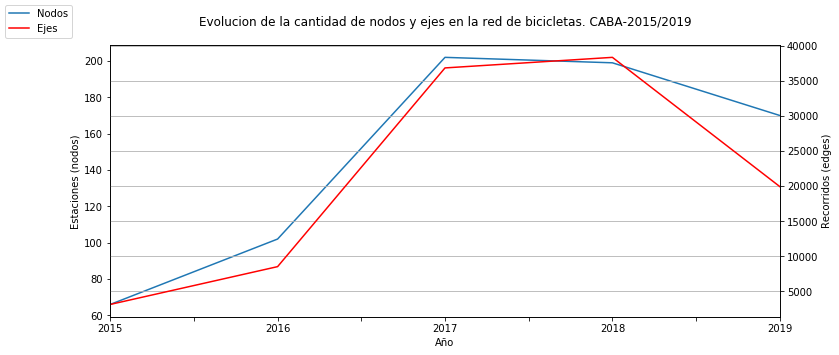

In [33]:
# Vemos como evolucionaron la cantidad de nodos y edges
ax = evolucion.plot(x="Año", y="Nodos", figsize=(12,5),legend=False)
ax2 = ax.twinx()
evolucion.plot(x="Año", y="Ejes", ax=ax2, figsize=(12,5), legend=False, color="r")
ax.figure.legend(loc='upper left')
ax.set_ylabel("Estaciones (nodos)")
ax2.set_ylabel("Recorridos (edges)")
plt.title('Evolucion de la cantidad de nodos y ejes en la red de bicicletas. CABA-2015/2019', y=1.05)
plt.grid();

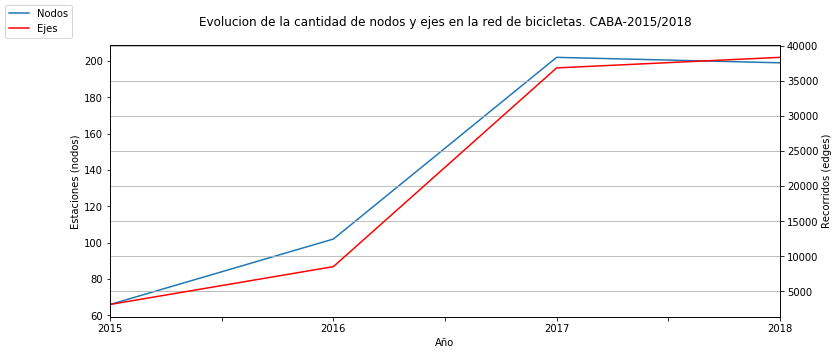

In [34]:
# Dejamos afuera a 2019 (no incluye todos los meses, solamente hasta febrero)

ax = evolucion.iloc[:4].plot(x="Año", y="Nodos", figsize=(12,5),legend=False)
ax2 = ax.twinx()
evolucion.iloc[:4].plot(x="Año", y="Ejes", ax=ax2, figsize=(12,5), legend=False, color="r")
ax.figure.legend(loc='upper left')
ax.set_ylabel("Estaciones (nodos)")
ax2.set_ylabel("Recorridos (edges)")
plt.title('Evolucion de la cantidad de nodos y ejes en la red de bicicletas. CABA-2015/2018', y=1.05)
plt.grid();

In [35]:
print('Entre 2016 y 2017, los nodos (estaciones) de la red de bicicletas de la Ciudad de Buenos Aires crecio un %s%%' % round((n17/n16-1)*100,2)) 

Entre 2016 y 2017, los nodos (estaciones) de la red de bicicletas de la Ciudad de Buenos Aires crecio un 98.04%


In [36]:
print('Por su parte, en el mismo periodo, la cantidad de recorridos (edges) de la red de bicicletas de la Ciudad de Buenos Aires crecio un %s%%'% round((e17/e16-1)*100,2))

Por su parte, en el mismo periodo, la cantidad de recorridos (edges) de la red de bicicletas de la Ciudad de Buenos Aires crecio un 332.01%


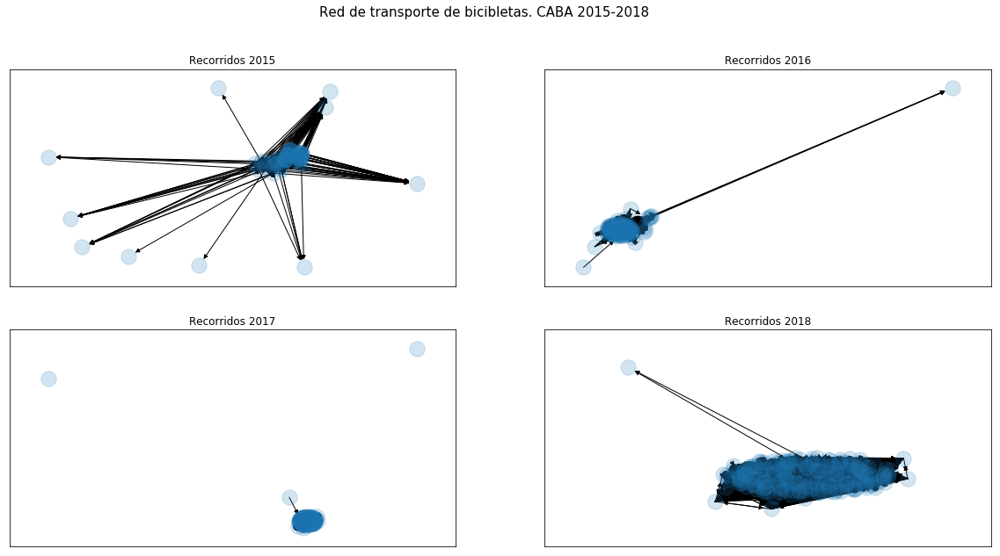

In [37]:
# Graficamos los grafos de la red de bicicletas por año
plt.figure(figsize=(20,10))

# bicigrafo2015
plt.subplot(2,2,1)
pos = nx.spring_layout(b15)
nx.draw_networkx_nodes(b15, pos, alpha=0.2, node_linewidth = 0.0,size=75)
nx.draw_networkx_edges(b15, pos, style='solid', aplha=0.1)
plt.title('Recorridos 2015')

# bicigrafo2016
plt.subplot(2,2,2)
pos2 = nx.spring_layout(b16)
nx.draw_networkx_nodes(b16, pos2, alpha=0.2, node_linewidth = 0.0,size=75)
nx.draw_networkx_edges(b16, pos2, style='solid', aplha=0.1)
plt.title('Recorridos 2016')

# bicigrafo2017
plt.subplot(2,2,3)
pos3 = nx.spring_layout(b17)
nx.draw_networkx_nodes(b17, pos3, alpha=0.2, node_linewidth = 0.0,size=75)
nx.draw_networkx_edges(b17, pos3, style='solid', aplha=0.1)
plt.title('Recorridos 2017')

# bicigrafo2018
plt.subplot(2,2,4)
pos4 = nx.spring_layout(b18)
nx.draw_networkx_nodes(b18, pos3, alpha=0.2, node_linewidth = 0.0,size=75)
nx.draw_networkx_edges(b18, pos3, style='solid', aplha=0.1)
plt.title('Recorridos 2018')

plt.suptitle('Red de transporte de bicibletas. CABA 2015-2018', fontsize=15);

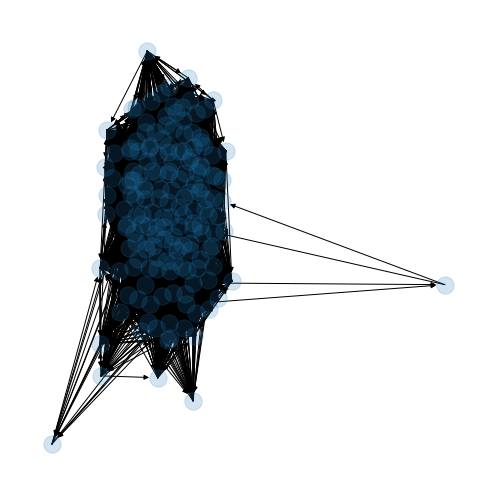

In [38]:
# Graficamos el bicigrafo19 aparte (tiene menos meses)
plt.figure(figsize=(7,7))
pos = nx.spring_layout(b19)
nx.draw_networkx_nodes(b19, pos, alpha=0.2, node_linewidth = 0.0,size=75)
nx.draw_networkx_edges(b19, pos, style='solid', aplha=0.1)
plt.axis('off')
plt.tight_layout()
plt.show()

In [39]:
# Direccionalidad de la red. Creamos una funcion para devolver el porcentaje de viajes dirigidos y selfloops

def direccionalidad(df, origen, destino):
    
    # se usa size() y no count() por si hubiera null cases
    agrupado = df.groupby([origen,destino]).size().reset_index(name='recorridos')
    agrupado.columns = ['origen','destino','recorridos']
    
    labels = ['SELF-LOOP', 'DIRIGIDO']
    sizes = [agrupado.loc[agrupado['origen']==agrupado['destino']]['recorridos'].sum(), 
             agrupado.loc[agrupado['origen']!=agrupado['destino']]['recorridos'].sum()]
    colors = ['#B7B8B6', '#4CB5F5']
    explode = (0.09, 0)
    
    plt.figure(figsize=(15,6))
    plt.pie(sizes, explode=explode, labels=None, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=140, pctdistance = 0.5)
 
    plt.legend(labels, loc=(0.22,0.1))
    plt.axis('equal')
    plt.title('Tipo de recorrido - ECOBICI-CABA', y=0.98)
    
    return plt.show()

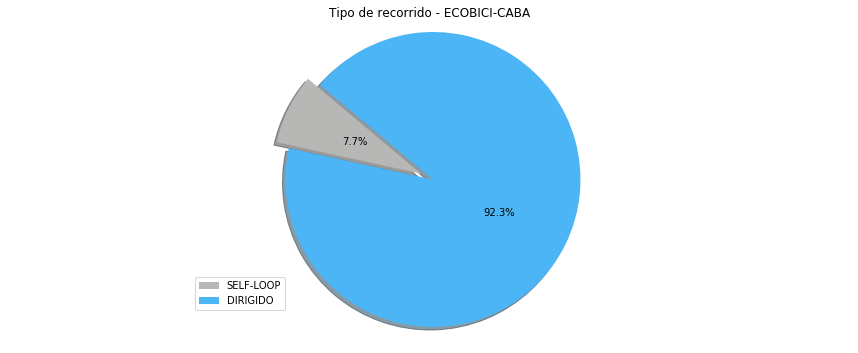

In [40]:
# Testeamos la funcion con 2018. La mayoria de los viajes son saliendo de una estacion y llegando a otra
direccionalidad(df18,'bici_nombre_estacion_origen','bici_nombre_estacion_destino')

In [41]:
# Creamos una funcion que nos devuelva el par de estaciones con mayor cantidad de recorridos realizados
def tipo_de_viajes(df,origen,destino):
    
    # se usa size() y no count() por si hubiera null cases
    agrupado = df.groupby([origen,destino]).size().reset_index(name='recorridos')
    agrupado.columns = ['origen','destino','recorridos']
    
    estaciones = agrupado.sort_values(by='recorridos', ascending=False).head()
    
    return estaciones

In [42]:
# Vemos el tipo de recorrido con mayor cantidad de viajes durante 2018
tipo_de_viajes(df18,'bici_nombre_estacion_origen','bici_nombre_estacion_destino')

,origen,destino,recorridos
23386,Pacífico,Pacífico,4848
28224,Plaza Italia,Plaza Italia,4757
37556,Vera Peñaloza,Vera Peñaloza,4477
23978,Parque Centenario,Parque Centenario,4131
13504,Godoy Cruz y Libertador,Godoy Cruz y Libertador,4033


En este punto, podemos ver que los viajes con mismo origen y destino son los que mayor cantidad de recorridos realizados tienen. Es decir que, si bien los self-loops tienen una representación menor en cantidad de viajes (para 2018, alrededor del 8%), analizados individualmente tienen una frecuencia de recorridos realizados mucho mayor que los viajes dirigidos. En otras palabras, para 2018 la cantidad de viajes dirigidos fue mayor a los "autodirigidos" pero con una frecuencia individual mucho menor.

In [43]:
# Corroboramos lo anterior (2018). Los viajes dirigidos son mas en cantidad pero con frecuencias de recorridos mucho menores!
agrupado.sort_values(by='recorridos', ascending=True).head()

,origen,destino,recorridos
37668,Villarroel,Moreno,1
28023,Plaza Houssay,Pinzon y M. Rodriguez,1
36916,Usina del Arte,Planetario,1
17566,Jose Marmol,Hospital Rivadavia,1
36917,Usina del Arte,Plaza Alemania,1


In [44]:
# Promedio de de cantidad de recorridos realizados por tipo de viaje: autodirigidos 2018
agrupado.loc[agrupado['origen']==agrupado['destino']]['recorridos'].mean()

1141.035175879397

In [45]:
# Promedio de de cantidad de recorridos realizados por tipo de viaje: dirigidos 2018
agrupado.loc[agrupado['origen']!=agrupado['destino']]['recorridos'].mean()

71.45553953061491

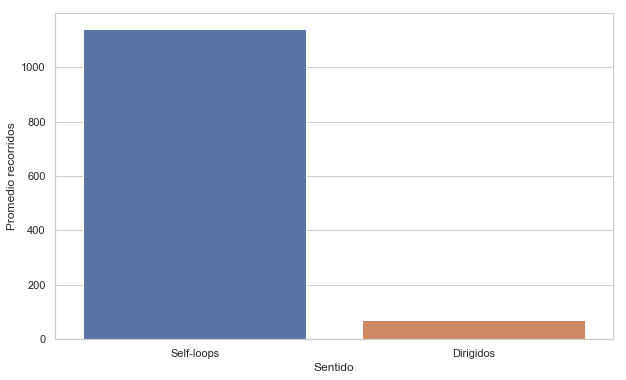

In [46]:
# Promedio de recorridos realizado por sentido de la conexion: self-loops y dirigidos

plt.figure(figsize=(10,6))
sns.set(style="whitegrid")
sns.barplot(x="Sentido", y="Promedio recorridos", 
            data=pd.DataFrame({'Sentido': ['Self-loops','Dirigidos'], 'Promedio recorridos':[1141,72]}));

Evidentemente esto es una característica estructural de la red de bicicletas. Hay muchos viajes direccionados que, individualmente, tienen pocos recorridos realizados. Por otra parte, los viajes autodirigidos son menores en cantidad de casos (algo lógico por la cantidad de estaciones y las combinaciones posibles que esto permite) pero con frecuencia de recorridos mucho mayor. Los mismos resultados se pueden corroborar para otros años. A modo de ejemplo, vemos qué ocurrió durante 2015.Este análisis podría aplicarse para cualquiera de los años disponibles y obtener seguramente los mismos resultados.

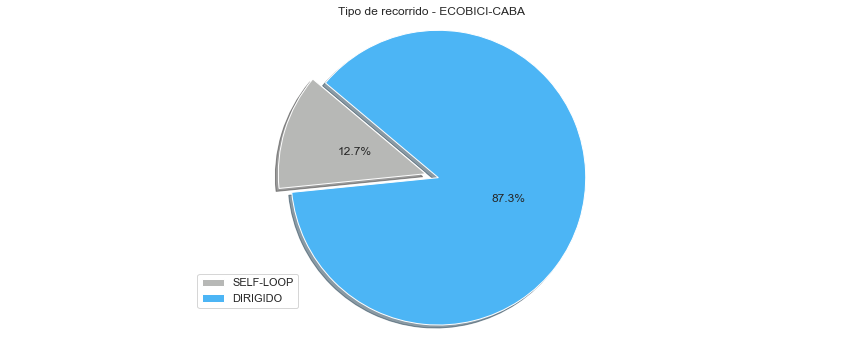

In [47]:
# Probamos las mismas funciones para 2015
direccionalidad(df15,'bici_nombre_estacion_origen','bici_nombre_estacion_destino')

In [48]:
tipo_de_viajes(df15,'bici_nombre_estacion_origen','bici_nombre_estacion_destino')

,origen,destino,recorridos
1591,Pacífico,Pacífico,5091
1716,Parque Las Heras,Parque Las Heras,4340
1654,Parque Centenario,Parque Centenario,4061
1120,Juana Manso,Juana Manso,3653
2311,Plaza Italia,Plaza Italia,3573


Tanto en 2015 como en 2018, la estación con mayor cantidad de recorridos fue Pacífico. Esta estación se encuantra en Santa Fé y Juan B.Justo. Entre las principales características de la zona se puede mencionar su proximidad con Plaza Italia y Palermo Hollywood.

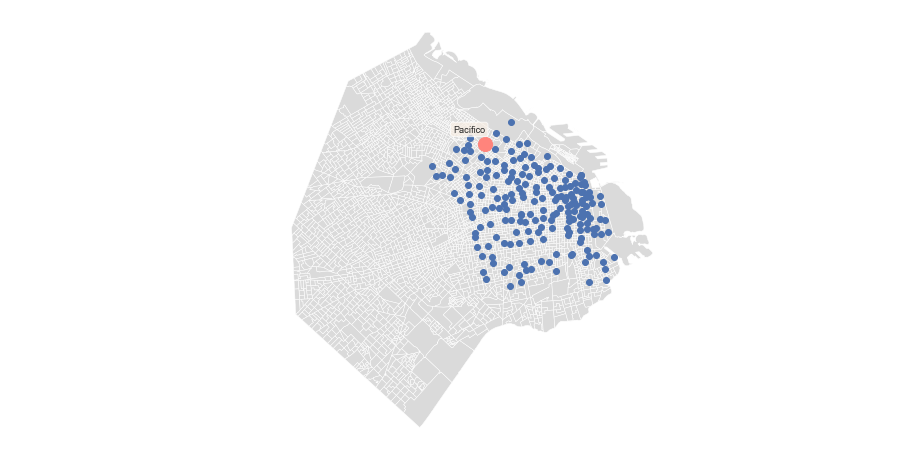

In [109]:
# radios censales caba
caba = gpd.read_file('data/informacion_censal_por_radio_2010.shp')

# ploteamos la estacion Pacifico
f, ax = plt.subplots(1,figsize=(15,8))

caba.plot(ax=ax, linewidth=0.5, color='#dadada')
estaciones.to_crs(crs=caba.crs).plot(ax=ax,marker='o')
pacifico = estaciones.loc[estaciones['NOMBRE']=='Pacífico'] 
pacifico.to_crs(crs=caba.crs).plot(ax=ax,marker='o', color='#FF847C', markersize=200)


props = dict(boxstyle='round', facecolor='linen', alpha=0.7)
for point in pacifico.to_crs(crs=caba.crs).iterrows():
    ax.text(point[1]['geometry'].centroid.x+20,
            point[1]['geometry'].centroid.y+600,
            point[1]['NOMBRE'],
            horizontalalignment='right',
            fontsize=9,
            bbox=props)    
    
    
plt.axis('equal')
ax.set_axis_off()

In [50]:
# ploteamos la estacion sobre un mapa dinamico
f, ax = plt.subplots(1,figsize=(8,8))

estaciones.plot(ax=ax,marker='o')
pacifico = estaciones.loc[estaciones['NOMBRE']=='Pacífico'] 
pacifico.plot(ax=ax,marker='o', color='#FF847C', markersize=200)

mplleaflet.display(fig=ax.figure, crs=pacifico.crs)

## Medidas de conexion de la red

Según Cardozo, Gómez y Parras (2009), el grado de comunicación recíproca entre los nodos de una red puede ser interpretada como el nivel de conexión (o cohesión en términos territoriales) que esta presenta para su funcionamiento interno. Es decir que, cuantos más arcos tenga el grafo, mayor será el grado de conectividad. Asimismo, esto indica la mayor o menor complejidad estructural de la red, lo cual está ligado directamente al número de nodos, arcos y a su disposición espacial  

El interés por esta clase de medidas,obedece a que el incremento de las conexiones a través del tiempo significa una mayor cohesión espacial para el territorio donde se emplaza la red

A continuación se presentan algunos índices extraídos del estudio de Cardozo, Gómez y Parras (2009). El mismo se encuentra disponible en http://revistascientificas.filo.uba.ar/index.php/rtt/article/view/223

1) Índice Beta de Kanskyexpresala: β = a / n

       Logra medir como aumenta la conectividad cuando se incrementa el número de arcos de un grafo (Seguí Pons y Petrus Bey, 1991). Las redes de transporte de estructura muy compleja asumen valores de índice β más elevados, mientras las redes cuya estructura es más sencilla, tendrán valores más bajos(Potrykowsky, 1984).


In [51]:
# Creamos funcion para el indice Beta
def cohesion(grafo):
    '''
    Devuelve el grado de conectividad de una red
    '''
    a = len(grafo.edges())
    n = len(grafo.nodes())
    beta = round(a/n, 2)
    return beta

In [52]:
# Creamos una lista con todos los grafos que queremos incluir en el indice
grafos = [b15,b16,b17,b18,b19]

# Calculamos el nivel de cohesion de la red y almacenamos el resultado en una lista
indice1 = [cohesion(i) for i in grafos]

In [53]:
indice1

[47.56, 83.58, 182.32, 192.63, 117.21]

2) El Índice Gamma: ɣ = a/(n*(n-1)/2)

       Relaciona el número de arcos existentes y el número máximo que puede existir dentro de un grafo determinado, teniendo en cuenta la cantidad de nodos de una red.  


In [54]:
# Funcion para calcular Beta max
def cohesion_max(grafo):
    '''
    Devuelve el porcentaje respecto del maximo posible de beta. Es una medida complementaria de cohesion
    '''
    a = len(grafo.edges())
    n = len(grafo.nodes())
    beta_max= a/(n*(n-1)/2)
    return beta_max    

In [55]:
# Calculamos el nivel de cohesion respecto del maximo posible de Beta y almacenamos el resultado en una lista
indice2 = [cohesion_max(i) for i in grafos]

In [56]:
indice2

[1.4634032634032634,
 1.6550184430207726,
 1.814147086350426,
 1.945789553829755,
 1.3871214758092587]

3) El Número Ciclomático: μ = a – (n – 1) – g

       Determina la cantidad de circuitos que existen dentro de un grafo. Entendiendo por circuito, cada una de las múltiples maneras que existen para ir desde un nodo hasta el mismo, sin tener que pasar dos veces por el mismo arco. Se calcula restando el número total de arcos (a) al número de nodos necesario para formar un árbol (n-1), restándose además los grafos inconexos(g)que puedan existir (Bosque Sendra, 1992)

In [57]:
# Funcion para calcular el node degree de cada grafo. Se puede usar la misma estructura para pasar otras labels y valores a los nodos.

def grado_nodo(grafo):
    '''
    Funcion para calcular el grado de cada nodos y pasarselo como 'label/value'
    '''
    
    for n, d in grafo.nodes(data=True):
        
        # Calcula el grado para cada nodo
        grafo.node[n]['degree'] = nx.degree(grafo,n)

In [58]:
# Aplicamos la funcion a todos los nodos con una lista por comprension
[grado_nodo(i) for i in grafos]

[None, None, None, None, None]

In [59]:
# Creamos una funcion para calcular el nro. ciclomatico de cada grafo
def ciclomatico(grafo):
    '''
    Devuelve el Numero Ciclomatico de un grafo
    '''
    a = len(grafo.edges())
    n = len(grafo.nodes())
    # Filtra por condicion del label del nodo y devuelve la cantidad de True (en este caso, nodos solitarios)
    g = len([n for n,d in grafo.nodes(data=True) if d['degree'] <1])
    u = a - (n - 1) - g
    return u

In [60]:
indice3 = [ciclomatico(i) for i in grafos]

In [61]:
indice3

[3074, 8424, 36628, 38136, 19757]

4) El Índice Alfa: α = (μ / 2 ∙ n – 5) ∙ 100

        Relaciona el número de circuitos observados en el grafo (µ) y los circuitos que existirán en caso de tratarse de un grafo completo. Se trata de una comparacion respecto del número máximo posible de circuitos en la red. Es un indicador de la complejidad de la red, que se obtiene del ratio entre el Número Ciclomático y el máximo posible de circuitos.

In [62]:
# Creamos una funcion para el indice alpha
def alpha(grafo):
    
    def ciclomatico(grafo):
        a = len(grafo.edges())
        n = len(grafo.nodes())
        # Filtra por condicion del label del nodo y devuelve la cantidad de True (en este caso, nodos solitarios)
        g = len([n for n,d in grafo.nodes(data=True) if d['degree'] <1])
        u = a - (n - 1) - g
        return u, n
    u = ciclomatico(grafo)[0]
    n = ciclomatico(grafo)[1]
    a = u/(2*n-5)
    return a

In [63]:
indice4 = [alpha(i) for i in grafos]

In [64]:
indice4

[24.20472440944882,
 42.33165829145729,
 91.79949874686717,
 97.0381679389313,
 58.97611940298508]

In [65]:
#Indices de cohesion
indices = pd.DataFrame({'Año':['2015','2016','2017','2018','2019'],'Beta':indice1, 'Beta_max': indice2, 'Ciclo': indice3, 'Alpha': indice4})

In [66]:
indices

,Año,Beta,Beta_max,Ciclo,Alpha
0,2015,47.56,1.463403,3074,24.204724
1,2016,83.58,1.655018,8424,42.331658
2,2017,182.32,1.814147,36628,91.799499
3,2018,192.63,1.945790,38136,97.038168
4,2019,117.21,1.387121,19757,58.976119


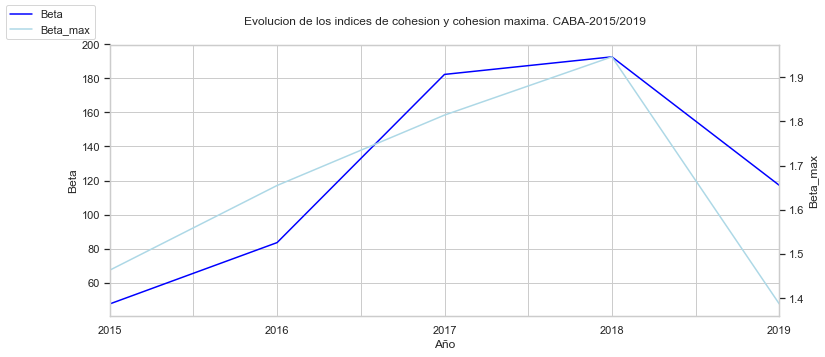

In [67]:
# Vemos como los indices de cohesion
ax = indices.plot(x="Año", y="Beta", figsize=(12,5),legend=False,color='Blue')
ax2 = ax.twinx()
indices.plot(x="Año", y="Beta_max", ax=ax2, figsize=(12,5), legend=False, color="lightblue")
ax.figure.legend(loc='upper left')
ax.set_ylabel("Beta")
ax2.set_ylabel("Beta_max")
plt.title('Evolucion de los indices de cohesion y cohesion maxima. CABA-2015/2019', y=1.05)
plt.grid();

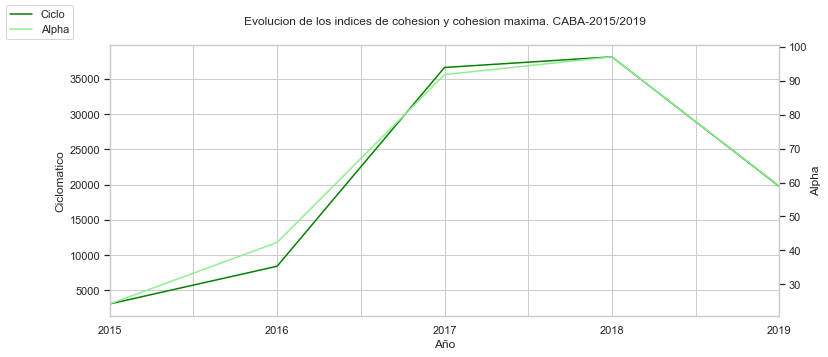

In [68]:
# Vemos como evolucionaron el numero ciclomatico y el indice alpha
ax = indices.plot(x="Año", y="Ciclo", figsize=(12,5),legend=False,color='Green')
ax2 = ax.twinx()
indices.plot(x="Año", y="Alpha", ax=ax2, figsize=(12,5), legend=False, color="lightgreen")
ax.figure.legend(loc='upper left')
ax.set_ylabel("Ciclomatico")
ax2.set_ylabel("Alpha")
plt.title('Evolucion de los indices de cohesion y cohesion maxima. CABA-2015/2019', y=1.05)
plt.grid();

El valor agregado de estos índices radica en la posibilidad de comparar o bien dos redes de características similares o la misma a lo largo del tiempo. Ahora bien, no nos dice otra cosa de lo que ya habíamos confirmado: la red de bicicletas de la Ciudad aumentó tanto en cantidad de estaciones como de recorridos realizados entre ellas. En otras palabras, en cantidad de nodos y ejes.

## Medidas de Accesibilidad y Centralidad

En una red de transporte, la cantidad de arcos que es necesario atravesar para llegar a un nodo de referencia desde cualquier otro puede darnos una idea de la accesibilidad topológica con la que cuenta cada nodo en la red. En un sistema público de bicicletas, la posibilidad de ir de un nodo a cualquier otro modifica un poco este concepto, ya que las relaciones entre ellos suele ser "uno a uno". Es decir, una estación de origen y otra de destino. No obstante, la cantidad de estaciones con las que se conecta y la frecuencia de viajes con las que cuenta un recorrido sí puede darnos una idea de la centralidad con la que cuenta un nodo dentro de la red. En otras palabras, la cantidad de conexiones entrantes y salientes, el grado del nodo, el promedio de conexiones (entre otras) son medidas que pueden ayudar a entender los patrones de uso principal dentro de la red de bicicletas. 

In [69]:
# Librerias (visualizacion grafos)
import nxviz as nv

### Matriz de conectividad 

...una tabla simétrica donde se indica con 1 las relaciones directas entre nodos y con 0 la ausencia de una conexión directa.

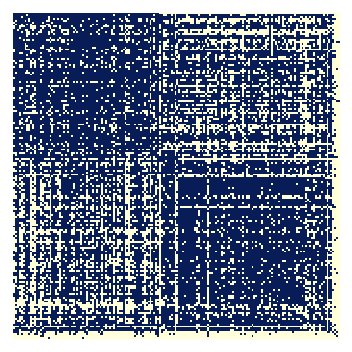

In [70]:
m = nv.MatrixPlot(b19)

# Draw m to the screen
m.draw()

# Display the plot
plt.show()

''

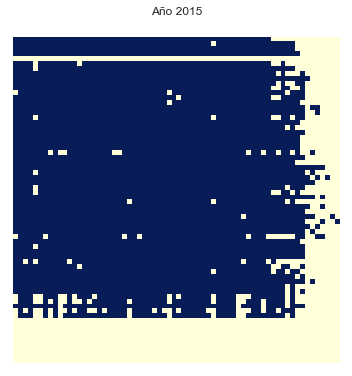

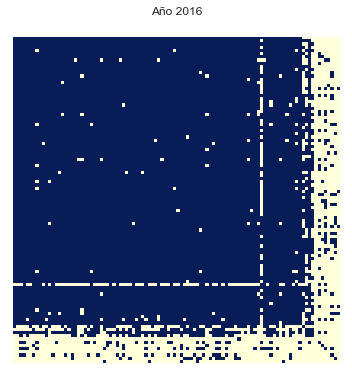

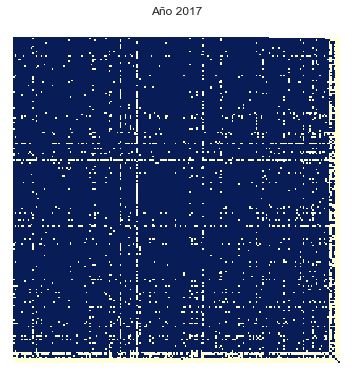

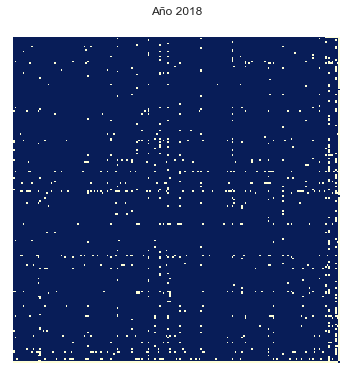

In [71]:
# El problema de graficar con nxviz es que crea su propio plot, con lo cual siempre queda afuera de cualquier subplot

# bicigrafo2015
m15 = nv.MatrixPlot(b15)
m15.draw()
plt.title('Año 2015')

# bicigrafo2016
m16 = nv.MatrixPlot(b16)
m16.draw()
plt.title('Año 2016')

# bicigrafo2017
m17 = nv.MatrixPlot(b17)
m17.draw()
plt.title('Año 2017')

# bicigrafo2018
m18 = nv.MatrixPlot(b18)
m18.draw() 
plt.title('Año 2018')

;

Se puede apreciar que, conforme avanzan los años la matriz de interacciones se expande cada vez mas. Esto parece tener cierto correlato con la forma o topologia del grafo. A continuacion se agregan algunas relaciones (la libreria no es muy comoda para graficar)

In [72]:
# Librerias (visualizacion)
import matplotlib.pyplot as plt 
import matplotlib.gridspec 

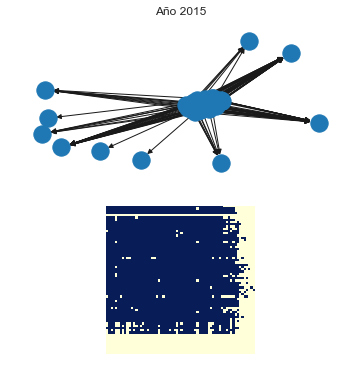

In [73]:
#2015
m = nv.MatrixPlot(b15)
m.draw()


gs = matplotlib.gridspec.GridSpec(2,1)
plt.gca().set_position(gs[1].get_position(plt.gcf()))
plt.gca().set_subplotspec(gs[1])

plt.subplot(gs[0])
nx.draw(b15)
plt.title('Año 2015', y=1.05)
plt.show()

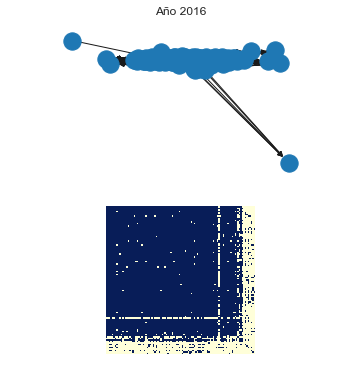

In [74]:
#2016
m2 = nv.MatrixPlot(b16)
m2.draw()


gs = matplotlib.gridspec.GridSpec(2,1)
plt.gca().set_position(gs[1].get_position(plt.gcf()))
plt.gca().set_subplotspec(gs[1])

plt.subplot(gs[0])
nx.draw(b16)
plt.title('Año 2016', y=1.05)

plt.show()

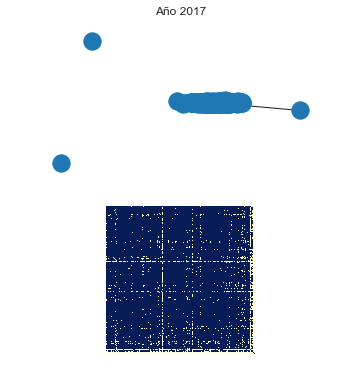

In [75]:
#2017
m3 = nv.MatrixPlot(b17)
m3.draw()


gs = matplotlib.gridspec.GridSpec(2,1)
plt.gca().set_position(gs[1].get_position(plt.gcf()))
plt.gca().set_subplotspec(gs[1])

plt.subplot(gs[0])
nx.draw(b17)
plt.title('Año 2017', y=1.05)

plt.show()

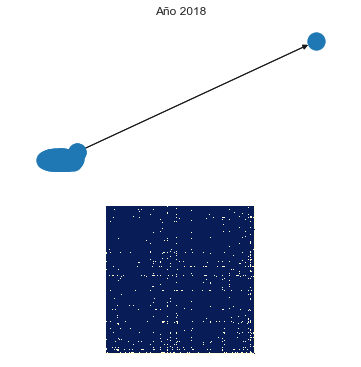

In [76]:
#2018
m4 = nv.MatrixPlot(b18)
m4.draw()


gs = matplotlib.gridspec.GridSpec(2,1)
plt.gca().set_position(gs[1].get_position(plt.gcf()))
plt.gca().set_subplotspec(gs[1])

plt.subplot(gs[0])
nx.draw(b18)
plt.title('Año 2018', y=1.05)

plt.show()

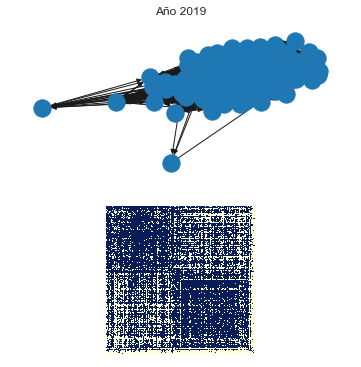

In [77]:
#2019
m5 = nv.MatrixPlot(b19)
m5.draw()


gs = matplotlib.gridspec.GridSpec(2,1)
plt.gca().set_position(gs[1].get_position(plt.gcf()))
plt.gca().set_subplotspec(gs[1])

plt.subplot(gs[0])
nx.draw(b19)
plt.title('Año 2019', y=1.05)

plt.show()

### Conexiones por nodo y año... 

In [78]:
# Creamos una funcion para devolver un dataframe con la cantidad de otros nodos que se conecta cada nodo
def matriz(grafo):
    '''
    Devuelve un dataframe con la matriz de relaciones entre nodos
    '''
    
    conexiones = nx.to_numpy_matrix(grafo)
    df = pd.DataFrame(conexiones)
    
    est_label = []
    [est_label.append(n) for n,d in grafo.nodes(data=True)]
    df['TOTAL'] = df[:].sum()
    df['ESTACION'] = est_label
    return df

In [79]:
# Aplicamos la funcion a la red de 2015
dfm15 = matriz(b15)

In [80]:
# Como se ve, la matriz devuelve con cuantas estaciones se conecto cada estacion
# Esmeralda, Hospital Italiano y A.Figueroa, las estaciones con menor presencia de conexiones direccionadas
dfm15.sort_values(by='TOTAL', ascending=True).head()

,0,1,2,3,4,5,6,7,8,9,...,58,59,60,61,62,63,64,65,TOTAL,ESTACION
65,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Esmeralda
63,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Hospital Italiano
64,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Acuña de Figueroa
62,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,Sánchez de Bustamante
61,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,Padilla


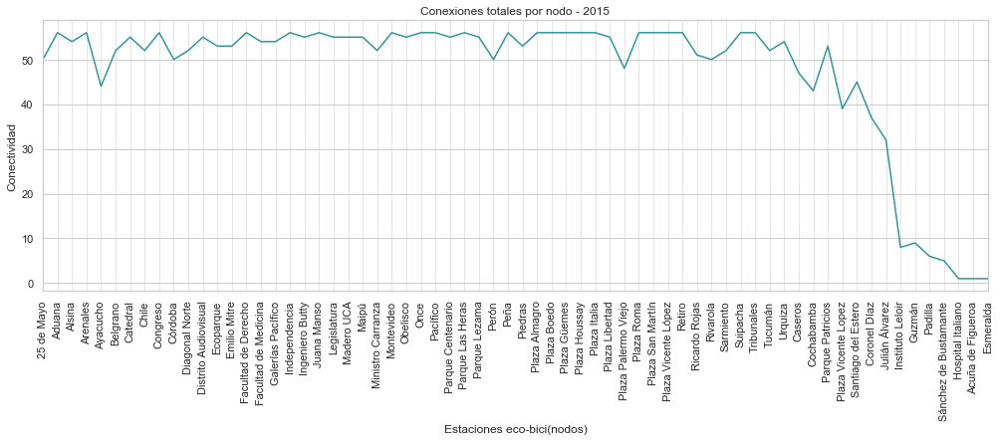

In [81]:
# Graficamos las conexiones por nodo
dfm15.plot(x='ESTACION', y='TOTAL',figsize=(17,5), color='#2F9599', legend=False)
plt.title('Conexiones totales por nodo - 2015')
plt.xlabel('Estaciones eco-bici(nodos)')
plt.ylabel('Conectividad')
plt.xticks(np.arange(len(dfm15)),dfm15['ESTACION'] , rotation=90)
plt.grid(axis='x', alpha=0.5);

In [82]:
# Aplicamos la funcion a la red de 2016
dfm16 = matriz(b16)

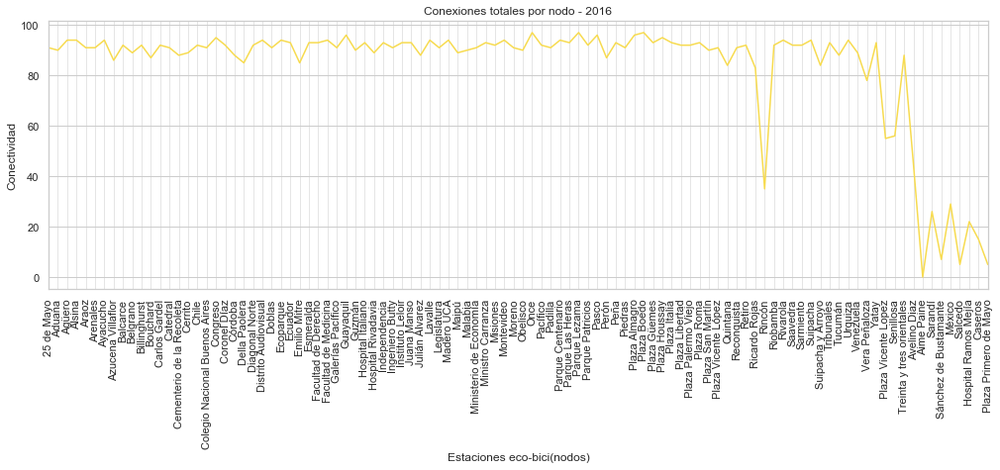

In [83]:
# Graficamos
dfm16.plot(x='ESTACION', y='TOTAL',figsize=(17,5), color='#F7DB4F', legend=False)
plt.title('Conexiones totales por nodo - 2016')
plt.xlabel('Estaciones eco-bici(nodos)')
plt.ylabel('Conectividad')
plt.xticks(np.arange(len(dfm16)),dfm16['ESTACION'] , rotation=90)
plt.grid(axis='x', alpha=0.5);

In [84]:
# Aplicamos la funcion a la red de 2017
dfm17 = matriz(b17)

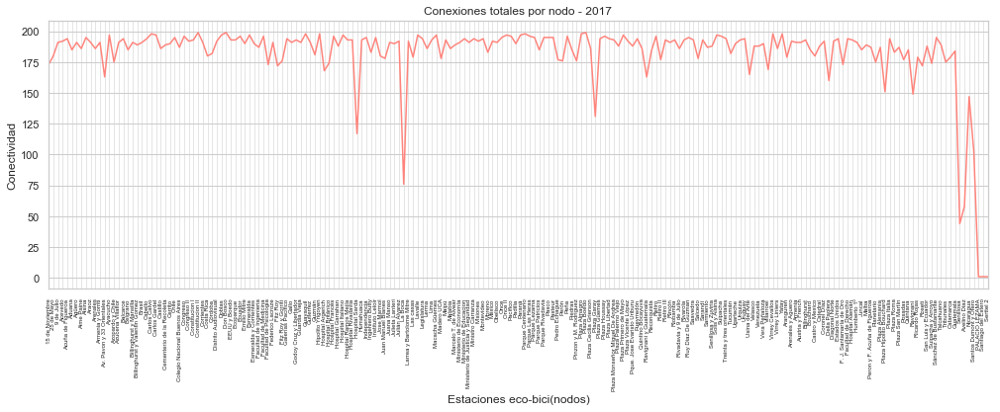

In [85]:
# Graficamos
dfm17.plot(x='ESTACION', y='TOTAL',figsize=(17,5),  color='#FF847C', legend=False)
plt.title('Conexiones totales por nodo - 2017')
plt.xlabel('Estaciones eco-bici(nodos)')
plt.ylabel('Conectividad')
plt.xticks(np.arange(len(dfm17)),dfm17['ESTACION'], fontsize=6, rotation=90)
plt.grid(axis='x', alpha=0.5);

In [86]:
# Aplicamos la funcion a la red de 2018
dfm18 = matriz(b18)

In [87]:
# En 2018, PALACIO LEZAMA fue la estacion con menor presencia de conexiones direccionadas (otras estaciones)
dfm18.sort_values(by='TOTAL', ascending=True).head()

,0,1,2,3,4,5,6,7,8,9,...,191,192,193,194,195,196,197,198,TOTAL,ESTACION
198,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,PALACIO LEZAMA
196,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,138.0,Santos Dumont y Otero
192,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,140.0,Plaza Hipolito Bouchard
94,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,170.0,La Boca
82,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,...,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,172.0,Hospital Sarda


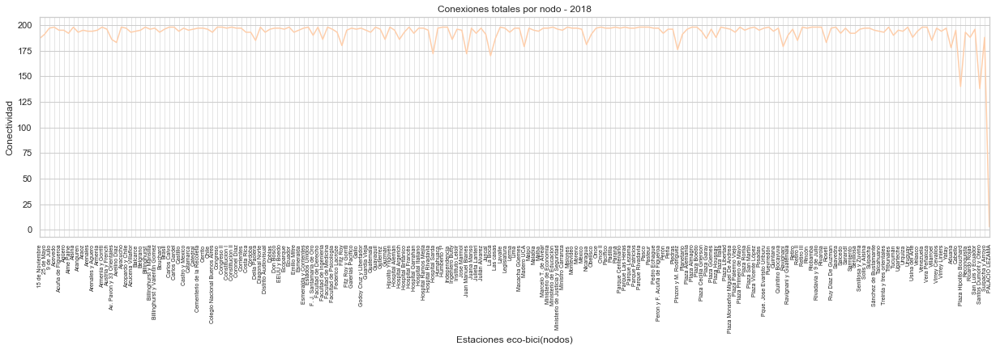

In [88]:
# Graficamos
dfm18.plot(x='ESTACION', y='TOTAL',figsize=(21,5), color='#FECEAB', legend=False)
plt.title('Conexiones totales por nodo - 2018')
plt.xlabel('Estaciones eco-bici(nodos)')
plt.ylabel('Conectividad')
plt.xticks(np.arange(len(dfm18)),dfm18['ESTACION'],fontsize=7, rotation=90)
plt.grid(axis='x', alpha=0.5);

En los ultimos años el nivel de conectividad entre nodos parece volverse más homogéneo (menos diferencias entre nodos). Excluimos de este análisis a la red de 2019 por tener sólo dos meses.

In [89]:
# # Aplicamos la funcion a la red de 2019
dfm19 = matriz(b19)

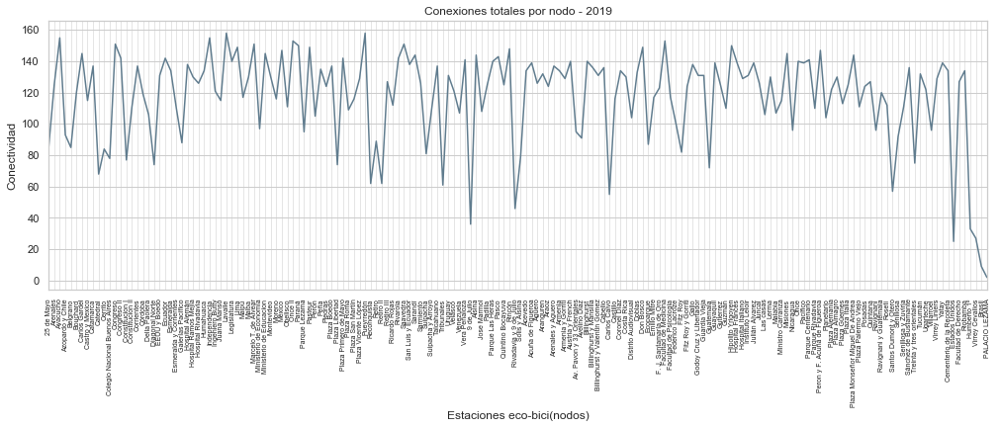

In [90]:
# Graficamos
dfm19.plot(x='ESTACION', y='TOTAL',figsize=(17,5), color='#607c8e', legend=False)
plt.title('Conexiones totales por nodo - 2019')
plt.xlabel('Estaciones eco-bici(nodos)')
plt.ylabel('Conectividad')
plt.xticks(np.arange(len(dfm19)),dfm19['ESTACION'] , fontsize=7, rotation=90)
plt.grid(axis='x', alpha=0.5);

**...recordemos que es el node degree de un grafo:**

![caption](img/node_degree.png)

In [91]:
# Creamos una funcion para devolver un dataframe con el node degree por grafo
def ndg(grafo):
    '''
    Devuelve un df con cada nodo, su degree, in_degree y out_degree
    '''
    
    ndg = grafo.degree()
    idg = grafo.in_degree()
    odg = grafo.out_degree()
    
    estacion = [k for k,v in ndg]
    in_degree = [v for k,v in idg]
    out_degree = [v for k,v in odg]
    node_degree = [v for k,v in ndg]
    
    df = pd.DataFrame(estacion).reset_index()
    df.drop(columns='index', inplace=True)
    df.columns = ['estacion']
    df['in_degree'],df['out_degree'],df['node_deg'] = in_degree, out_degree, node_degree
    
    return df

In [92]:
# Se observa que el node_degree en nuestro grafo, al ser dirigido, equivale a la suma del lin y el out
ndg(b15).sort_values(by='node_deg', ascending=False).head()

,estacion,in_degree,out_degree,node_deg
26,Once,56,63,119
32,Peña,56,62,118
38,Plaza Italia,56,61,117
37,Plaza Houssay,56,61,117
36,Plaza Güemes,56,61,117


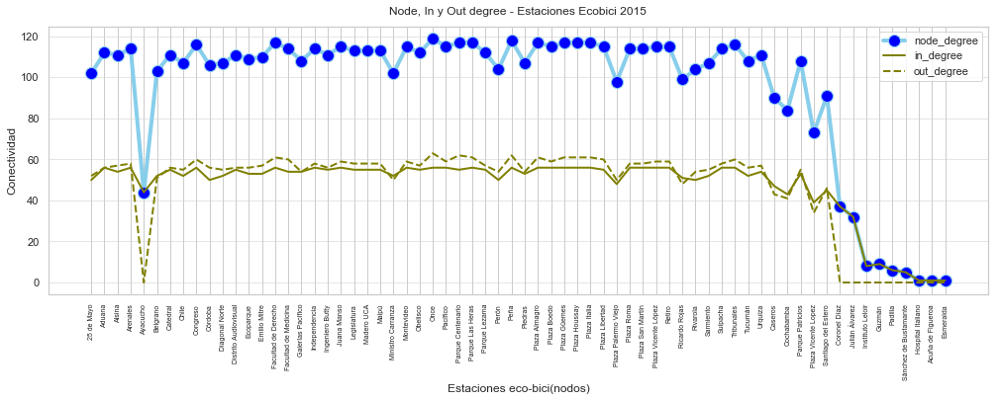

In [93]:
# Instanciamos la funcion
ndg15 = ndg(b15)
# Graficamos el node, el in y el out degree para 2015
plt.figure(figsize=(17,5))
plt.plot('estacion', 'node_deg', data=ndg15, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4, label='node_degree')
plt.plot('estacion', 'in_degree', data=ndg15, marker='', color='olive', linewidth=2)
plt.plot('estacion', 'out_degree', data=ndg15, marker='', color='olive', linewidth=2, linestyle='dashed')
plt.legend()
plt.title('Node, In y Out degree - Estaciones Ecobici 2015',y=1.02)
plt.xlabel('Estaciones eco-bici(nodos)')
plt.ylabel('Conectividad')
plt.xticks(np.arange(len(ndg15)),ndg15['estacion'] , fontsize=7, rotation=90)
plt.grid(axis='y', alpha=0.5);

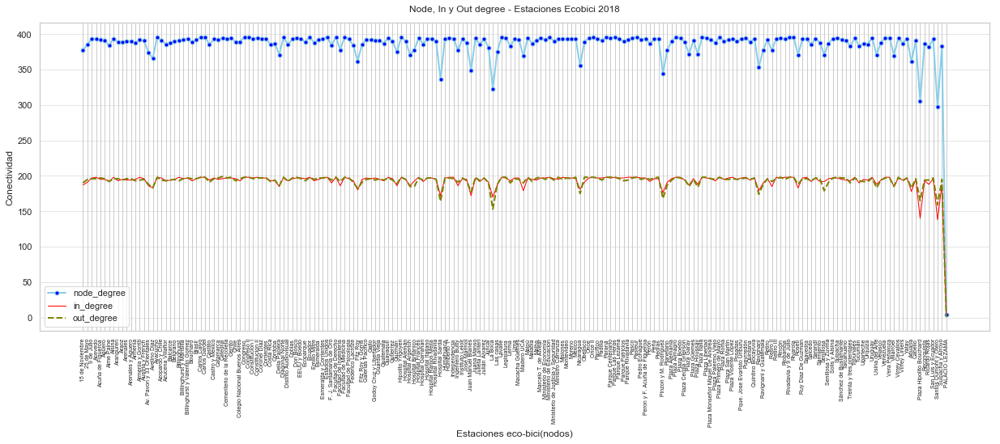

In [94]:
# Instanciamos la funcion y repetimos el grafico para 2018
ndg18 = ndg(b18)

plt.figure(figsize=(21,7))
plt.plot('estacion', 'node_deg', data=ndg18, marker='o', markerfacecolor='blue', markersize=5, color='skyblue', linewidth=2, label='node_degree')
plt.plot('estacion', 'in_degree', data=ndg18, marker='', color='red', linewidth=1)
plt.plot('estacion', 'out_degree', data=ndg18, marker='', color='olive', linewidth=2, linestyle='dashed')
plt.legend()
plt.title('Node, In y Out degree - Estaciones Ecobici 2018',y=1.02)
plt.xlabel('Estaciones eco-bici(nodos)')
plt.ylabel('Conectividad')
plt.xticks(np.arange(len(ndg18)),ndg18['estacion'] , fontsize=7, rotation=90)
plt.grid(axis='y', alpha=0.5);

In [ ]:
TAMBIEN SE PODRIA PROBAR EL GRADO PROMEDIO POR ESTACION. ES DECIR, CON CUANTOS OTROS NODOS SE CONECTA (EN PROMEDIO) CADA ESTACION

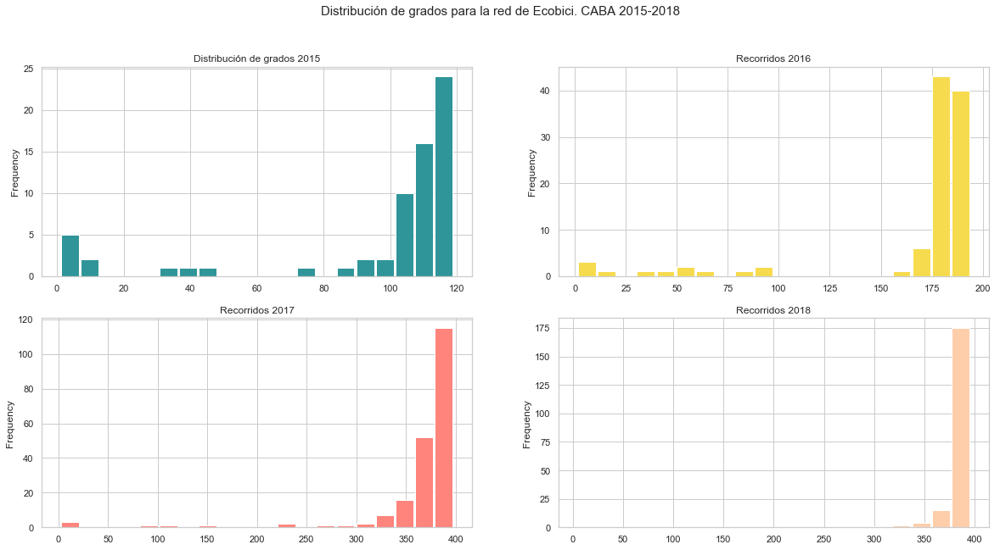

In [95]:
# Graficamos un histograma por año para ver la distribucion del grado por año
plt.figure(figsize=(20,10))

plt.subplot(2,2,1)
grados15 = pd.Series([b15.degree(n) for n in b15.nodes()])
grados15.plot.hist(grid=True, bins=20, rwidth=0.9,
                   color='#2F9599')
plt.title('Distribución de grados 2015')

plt.subplot(2,2,2)
grados16 =  pd.Series([b16.degree(n) for n in b16.nodes()])
grados16.plot.hist(grid=True, bins=20, rwidth=0.9,
                   color='#F7DB4F')
plt.title('Recorridos 2016')

plt.subplot(2,2,3)
grados17 =  pd.Series([b17.degree(n) for n in b17.nodes()])
grados17.plot.hist(grid=True, bins=20, rwidth=0.9,
                   color='#FF847C')
plt.title('Recorridos 2017')

plt.subplot(2,2,4)
grados18 =  pd.Series([b18.degree(n) for n in b18.nodes()])
grados18.plot.hist(grid=True, bins=20, rwidth=0.9,
                   color='#FECEAB')
plt.title('Recorridos 2018')

plt.suptitle('Distribución de grados para la red de Ecobici. CABA 2015-2018', fontsize=15);

El histograma muestra un emparejamiento en el esquema de conexiones. Al igual la matriz de adyacencias, el node degree muestra que el sistema público de bicicletas se ha ido expandiendo no sólo en cantidad de estaciones sino también en usabilidad. Es decir, en cantidad de conexiones (o bien recorridos realizados entre estaciones).

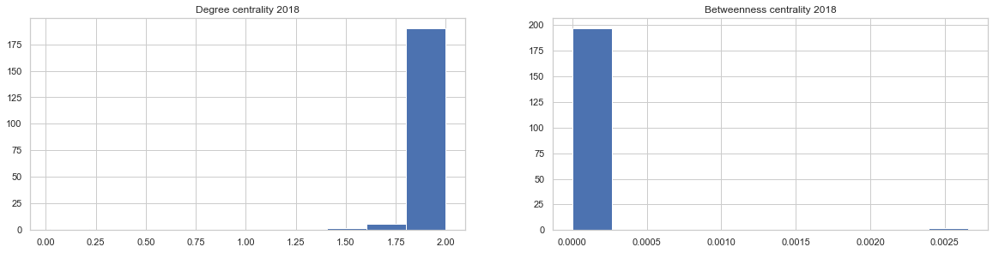

In [96]:
# Ploteamos el degree y el betweenness centrality para 2018
plt.figure(figsize=(20,10))
plt.subplot(2,2,1)
plt.hist(list(nx.degree_centrality(b18).values()))
plt.title('Degree centrality 2018')

plt.subplot(2,2,2)
plt.hist(list(nx.betweenness_centrality(b18).values()))
plt.title('Betweenness centrality 2018');

El degree centrality muestra un valor que se encuentra directamente asociado a la forma en la que se palnteó la red. Es decir que, la mayoría de los nodos cuentan con dos vecinos. Esto refleja que el grafo se planteó como una matriz "origen-destino" y no se siguió una lógica de usuario. Posiblemente, identificando los viajes a partir del ID de cada recorrido los valores (tanto de este índice como del beetweenness puedan ser diferentes. Esto queda pendiente para un análisis de "community detecion". 

### Matriz de accesibilidad: nociones de distancia en un grafo  

La distancia dentro de un grafo (también conocida como "shortest path" o "geodesic path") puede entenderse como cantidad de arcos mínimos que son necesarios recorrer para ir desde un nodo a cada uno de los restantes (Seguí Pons y Petrus Bey, 1991). En el caso de los grafos dirigidos cada path debe seguir el sentido de la conexión de los nodos. Esta noción de "camino más corto" es útil para entender cómo es la lógica de comportamiento de una red de transporte que no sigue un orden lógico o lineal para su conjunto de estaciones. A diferencia de una red de subtes o colectivos, las estaciones no funcionan como "paradas" que respetan un orden. En una red de bicicletas generalmente se va de una estación otra. Esto significa que el camino más corto debería ser, en términos generales, un arco. Esto es, ir de A a B (o biceversa) debería ser el comportamiento más frecuente. Pero como estamos aplicando la teoría de grafos para estudiar nuestra red, corroboremos que esto sea así...

![caption](img/distancia.png)

In [97]:
# Construimos las matrices de accesibilidad para cada grafo

ma15= pd.DataFrame(dict(nx.all_pairs_shortest_path_length(b15)))

ma16= pd.DataFrame(dict(nx.all_pairs_shortest_path_length(b16)))

ma17= pd.DataFrame(dict(nx.all_pairs_shortest_path_length(b17)))

ma18= pd.DataFrame(dict(nx.all_pairs_shortest_path_length(b18)))

ma19= pd.DataFrame(dict(nx.all_pairs_shortest_path_length(b19)))

In [98]:
ma15.head()

,25 de Mayo,Aduana,Alsina,Arenales,Ayacucho,Belgrano,Catedral,Chile,Congreso,Córdoba,...,Santiago del Estero,Coronel Díaz,Julián Álvarez,Instituto Leloir,Guzmán,Padilla,Sánchez de Bustamante,Hospital Italiano,Acuña de Figueroa,Esmeralda
25 de Mayo,0,1,1,1,NaN,1,1,1,1,1,...,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Acuña de Figueroa,2,2,2,2,NaN,2,2,2,2,2,...,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN
Aduana,1,0,1,1,NaN,1,1,1,1,1,...,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Alsina,1,1,0,1,NaN,1,1,1,1,1,...,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Arenales,1,1,1,0,NaN,1,1,1,1,1,...,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [99]:
print(nx.shortest_path(b15, '25 de Mayo', 'Santiago del Estero'))

['25 de Mayo', 'Aduana', 'Santiago del Estero']


Vemos que no hay paths directos entre 25 de Mayo y Santiago del Estero...

In [100]:
df15.loc[(df15.bici_nombre_estacion_origen == '25 de Mayo') & (df15.bici_nombre_estacion_destino == 'Santiago del Estero')]

,bici_id_usuario,bici_Fecha_hora_retiro,bici_tiempo_uso,bici_nombre_estacion_origen,bici_estacion_origen,bici_nombre_estacion_destino,bici_estacion_destino,bici_sexo,bici_edad


In [101]:
# vemos los valores maximos de distancia en nuestra matriz
maximo = ma15.max()

#for i in maximo:
    #print(i.unique())
    
maximo.unique()

array([2., 0., 3.])

Cada matriz representa la cantidad de arcos que son necesarios recorrer para ir de una estación a otra. Así, y como se observa en el ejemplo, para ir de 25 de Mayo a Santiago del Estero, la distancia mínima son tres arcos. Esto significa que no hay caminos directos entre ambas estaciones. Es decir que, la única forma de conectarlas sería a través de la estación Aduana. Ahora bien, no debemos confundirnos. Esta conexión puede corresponder al mismo usuario como no. Dado que la mayoría de los vínculos son recorridos directos entre dos estaciones. Muy posiblemente, las estaciones cuya distancia máxima sea superior a uno estén conectadas por distintos usuarios (eso se puede corroborar indexando el dataframe original).

**Bonus: algunos índices para trabajar la noción de accesibilidad**

A continuación presentamos algunos índices trabajados en el estudio de Cardozo, Gómez y Parras (2009). Estos reflejan distintas maneras de trabajar la noción de "shortest path" que desarrollamos en la sección anterior. Por las características de nuestra red, estos índices vuelven a mostrar los mismos resultados que vimos anteriormente: la accesibilidad mejora básicamente por el aumento en el número de nodos y arcos.

1) El Número Asociado de Köning: 
    
        resulta ser el valor mayor de cada fila en la Matriz de Accesibilidad, dicho número da una idea de la accesibilidad que posee el nodo de referencia con relación al nodo más lejano topológicamente. Cuanto menor sea el valor del Número Asociado, mayor será la accesibilidad del nodo (Garrido Palacios, 1995).

In [102]:
# Generamos el nro de koning para cada grafo
NK15,NK16,NK17,NK18,NK19 = ma15.max(axis=0), ma16.max(axis=0), ma17.max(axis=0), ma18.max(axis=0), ma19.max(axis=0)

In [103]:
NK18.head()

15 de Noviembre      2.0
25 de Mayo           2.0
9 de Julio           2.0
Acevedo              2.0
Acuña de Figueroa    2.0
dtype: float64

2) Índice de Shimbel: Shimbel = ∑ dxy

        se obtiene sumando los valores de cada fila de la Matriz de Accesibilidad Topológica, lo que muestra la cantidad de arcos a atravesar para ir desde un nodo a todos los demás del grafo(Garrido Palacios, 1995)

In [104]:
# Generamos el indice de shimbel para cada grafo
SH15,SH16,SH17,SH18,SH19 = ma15.sum(axis=0), ma16.sum(axis=0), ma17.sum(axis=0), ma18.sum(axis=0), ma19.sum(axis=0)

In [105]:
SH18.head()

15 de Noviembre      207.0
25 de Mayo           202.0
9 de Julio           201.0
Acevedo              201.0
Acuña de Figueroa    200.0
dtype: float64

3) Indice de dispersion: Índice G = ∑ Shimbel

        mide el nivel de accesibilidad para el conjunto de la red, y se obtiene de la suma de todos los índices Shimbel del grafo (número de arcos que es preciso atravesar para llegar desde un nodo a los demás).

In [106]:
# Generamos el indice de dispersion ara cada grafo
G15, G16, G17, G18, G19 = SH15.sum(), SH16.sum(), SH17.sum(), SH18.sum(), SH19.sum()

4) Indice de Accesibilidad Media (IAM): IAM = Índice G / n

        determina un valor promedio de la accesibilidad en la red a partir del cociente entre, el índice G de Dispersión y el número de nodos existentes. Este promedio de la red permite comparar diferentes grafos, o ver dentro de una misma red la accesibilidad de cada nodo (índice de Shimbel) respecto a la media (índice G); los que superan el promedio, son los menos accesibles.

In [107]:
IAM15, IAM16 = round(G15/len(b15.nodes(data=True)),2), round(G16/len(b16.nodes(data=True)),2)

IAM17, IAM18 = round(G15/len(b17.nodes(data=True)),2), round(G18/len(b16.nodes(data=True)),2)

IAM19 = round(G19/len(b19.nodes(data=True)),2)

In [108]:
IAM18

394.83

## INTERACCION ENTRE EL SISTEMA DE TRANSPORTE Y EL ESPACIO GEOGRAFICO

Esta sección busca mostrar el comportamiento de la red de bicicletas en el tiempo. El concepto de "viajes netos" es una forma de mostrar de manera dinámica las diferencias en términos de "in" y "out" degree de nuestro grafo. De tal manera, las salidas o arribos netos cuentan la cantidad de conexiones entrantes y salientes para cada una de las estaciones en distintos momentos horarios.

### VIAJES NETOS: PARTE 1

In [66]:
import folium

# Esta es la forma correcta de cargar un mapa con folium. En el ejemplo se agrega un marker
folium_map = folium.Map(location=[-34.6131500,-58.3772300],
                        zoom_start=13,
                        tiles="CartoDB dark_matter")
marker = folium.CircleMarker(location=[-34.6131500,-58.3772300])
marker.add_to(folium_map)

In [67]:
folium_map

In [68]:
# Funcion para devolver mes y hora para cada uno de los dataframes
def mes_hora(df):
    df["bici_Fecha_hora_retiro"] = pd.to_datetime(df["bici_Fecha_hora_retiro"])
    df["mes"] = df["bici_Fecha_hora_retiro"].map(lambda x: x.month)
    df["hora"] = df["bici_Fecha_hora_retiro"].map(lambda x: x.hour)
    return df

In [69]:
# Aplicamos la funcion para 2018
df18 = mes_hora(df18)

In [70]:
# Chequeamos el dataframe
df18.head(2)

,bici_id_usuario,bici_Fecha_hora_retiro,bici_tiempo_uso,bici_nombre_estacion_origen,bici_estacion_origen,bici_nombre_estacion_destino,bici_estacion_destino,bici_sexo,bici_edad,mes,hora
0,107148.0,2018-12-31 23:56:42,39.0,Parque Lezama,6,Austria y French,200.0,MASCULINO,27.0,12,23
1,140759.0,2018-12-31 23:40:14,7.0,Cementerio de la Recoleta,166,Quintana,115.0,FEMENINO,65.0,12,23


In [71]:
# Seleccionamos la latitud y longitud de cada estacion para asignarla a los df de recorridos
# Este dataframe sirve para todos los años
seleccion = estaciones[['NOMBRE','geometry' ]]
seleccion_b = seleccion.copy()
seleccion_b['x'], seleccion_b['y'] = estaciones.geometry.x, estaciones.geometry.y
# Dejamos afuera la gemetry
coordenadas = seleccion_b[['NOMBRE', 'x', 'y']]

In [72]:
# Funcion para devolver la latitud y la longitud de las estaciones de origen y destino para cada año
def coord_or_de(df):
    '''
    Devuelve latitud y longitud de las estaciones de origen y destino en un df integrado al original
    '''
    
    pre1 = pd.merge(df, coordenadas, left_on='bici_nombre_estacion_origen', right_on='NOMBRE')
    pre1.rename(columns={'x': 'lon_or', 'y': 'lat_or'}, inplace=True)

    pre2 = pd.merge(pre1, coordenadas, left_on='bici_nombre_estacion_destino', right_on='NOMBRE')
    pre2.rename(columns={'x': 'lon_de', 'y': 'lat_de'}, inplace=True)

    pre2.drop(columns=['NOMBRE_x','NOMBRE_y' ], inplace=True)
    
    return pre2  

In [73]:
# Aplicamos la funcion para 2018
df181 = coord_or_de(df18)

In [74]:
# Vemos que ahora el df tiene las coordenadas de la estacion de origen y de destino.
# Esto es un requisito para correr la funcion 'get_trip_counts_by_hour' que se arma abajo
df181.head(2)

,bici_id_usuario,bici_Fecha_hora_retiro,bici_tiempo_uso,bici_nombre_estacion_origen,bici_estacion_origen,bici_nombre_estacion_destino,bici_estacion_destino,bici_sexo,bici_edad,mes,hora,lon_or,lat_or,lon_de,lat_de
0,107148.0,2018-12-31 23:56:42,39.0,Parque Lezama,6,Austria y French,200.0,MASCULINO,27.0,12,23,-58.369112,-34.628747,-58.403764,-34.588639
1,412129.0,2018-12-19 16:59:36,60.0,Parque Lezama,6,Austria y French,200.0,MASCULINO,28.0,12,16,-58.369112,-34.628747,-58.403764,-34.588639


In [75]:
# Funcion para conseguir la cantidad de viajes netos por hora entre 'salidas de' y 'llegadas a' la estacion
def get_trip_counts_by_hour(df, hora):
    
    '''
    Devuelve un df con la cantidad neta (entrantes y salientes) de viajes por estacion
    ...
    
    Argumentos:
    ----------
    df: dataframe con las coordenadas de la estacion de origen y destino
    hora: la hora que se desea analizar
    
    '''
    
    # arma un df por estacion con su localizacion correspondiente
    locations = df.groupby("bici_estacion_origen").first()
    locations = locations.loc[:, ["lat_or",
                              "lon_or",
                              "bici_nombre_estacion_origen"]]
    
    # selecciona hora del dia
    subset = df[df["hora"]==hora]
    
    # cuenta la cantidad de salidas o viajes iniciados por estacion de origen
    departure_counts =  subset.groupby("bici_estacion_origen").count()
    departure_counts = departure_counts.iloc[:,[0]]
    departure_counts.columns= ["Departure Count"]
    
    # cuenta la cantidad de llegadas o viajes finalizados por estacion de destino
    arrival_counts =  subset.groupby("bici_estacion_destino").count().iloc[:,[0]]
    arrival_counts.columns= ["Arrival Count"]

    # une la cantidad de salidas y llegadas por estacion (location)
    trip_counts = departure_counts.join(locations).join(arrival_counts)
    return trip_counts

In [76]:
# Asi deberia quedar el dataframe
get_trip_counts_by_hour(df181, 9).head()

,Departure Count,lat_or,lon_or,bici_nombre_estacion_origen,Arrival Count
bici_estacion_origen,,,,,
1,1031,-34.583580,-58.391855,Facultad de Derecho,873
2,1803,-34.593036,-58.374225,Retiro,917
3,517,-34.611689,-58.368322,Aduana,562
4,814,-34.602168,-58.368354,Plaza Roma,1371
5,1049,-34.580575,-58.420399,Plaza Italia,755


In [77]:
# Funcion para plotear en un mapa las estacinoes graduadas por cantidad neta de viajes
def plot_station_counts(trip_counts):
    
    '''
    Devuelve un mapa navegable con la cantidad de estaciones graduadas por cantidad neta de viajes
    ...
    Argumentos
    ----------
    trip_counts: dataframe con la cantidad de viajes salientes y entrantes por estacion
    '''
    
    # genera el mapa base (Ciudad de Buenos Aires). Con el width se regula el extent del layer
    folium_map = folium.Map(location=[-34.6004687,-58.4009038],
                            zoom_start=12,
                            tiles="CartoDB dark_matter",
                            width='100%')

    # loop sobre las filas del df de cantidad de viajes
    for index, row in trip_counts.iterrows():
        # calcula cantidad de viajes netos
        net_departures = (row["Departure Count"]-row["Arrival Count"])
        
        # funcionalidad de folium: genera un pop-up con un on-click en el punto
        popup_text = "{}<br> total arrivals: {} <br> total departures: {}<br> net departures: {}"
        popup_text = popup_text.format(row["bici_nombre_estacion_origen"],
                          row["Arrival Count"],
                          row["Departure Count"],
                          net_departures)
        
        # graduacion del punto segun la cantidad neta de viajes
        radius = net_departures/20
        
        # colorea cada punto segun condicion. Dejo los otros colores del codigo fuente. 
        # si es mayor a 0 hubieron mas salidas que llegadas
        if net_departures>0:
            # color="#FFCE00" # orange
            # color="#007849" # green
            color="#E37222" # tangerine
        else:
            # color="#0375B4" # blue
            # color="#FFCE00" # yellow            
            color="#0A8A9F" # teal
        
        # agrega el punto sobre el mapa
        folium.CircleMarker(location=(row["lat_or"],
                                      row["lon_or"]),
                            radius=radius,
                            color=color,
                            popup=popup_text,
                            fill=True).add_to(folium_map)
    return folium_map

In [78]:
# ...probamos la funcion para estimar cantidad neta de viajes para 2018
nueve = get_trip_counts_by_hour(df181, 9)
dioch = get_trip_counts_by_hour(df181, 18)

####  PATRONES DE "MIGRACION" POR HORA: VIAJES NETOS (ENTRANTES VS SALIENTES) DE CADA ESTACION

Los siguientes mapas muestran los viajes netos para cada hora del día. Los puntos naranjas muestran, de forma graduada, las estaciones en las que (para la hora indicada) la cantidad de salidas fueron mayores que la cantidad de llegadas.

De esta manera, se puede ver de alguna manera, de dónde vienen o hacia dónde van los usuarios del sistema público de bicicletas en cada momento del día. 

In [79]:
# Saliendo de casa: mayor cantidad de salidas desde diversos puntos de la ciudad
plot_station_counts(nueve)

In [80]:
# Saliendo del trabajo: mayor cantidad de salidas con concentracion en un eje (microcentro-norte y sur. En Palermo hay bocha tb.)
plot_station_counts(dioch)

Como conclusión de estos mapas, se puede ver que (según la hora del día), hay zonas de la ciudad con mayor cantidad de salidas o llegadas.

### VIAJES NETOS: PARTE2

#### PATRONES DE MOVILIDAD Y DENSIDAD DE TRAFICO POR ZONA 

In [81]:
from PIL import Image, ImageDraw
import matplotlib.colors
from matplotlib.colors import LinearSegmentedColormap, rgb_to_hsv, hsv_to_rgb
import scipy.ndimage.filters

La función 'get_kernel' se crea para dar un "efecto de brillo" donde hay una mayor intersección de líneas. 
Para eso, se crea un kernel (suerte de ponderador) con el que se multiplican los pixeles de la imagen en una operación matricial. En este artículo se detalla un poco mejor: 

https://en.wikipedia.org/wiki/Kernel_(image_processing)#Convolution

In [82]:
# Esta funcion se crea para crear un "efecto de brillo" donde hay una mayor intersección de líneas. 
# Para eso, se crea un kernel que se aplica a un un "convolution filter" ("cómo la forma de una función es modificada por otra") 

def get_kernel(kernel_size, blur=1/20, halo=.001):
    """
    Crea un (n*2+1)x(n*2+1) numpy array.
    El output se usa como kernel para el convolution filter.
    """
    
    # genera una grilla de x e y
    x, y = np.mgrid[0:kernel_size*2+1, 0:kernel_size*2+1]
    
    center = kernel_size + 1  # centro del pixel
    r = np.sqrt((x - center)**2 + (y - center)**2)  # distancia desde el centro
    
    # se crea el kernel. Este se puede ir ajustando conforme el efecto que se quiera dar
    kernel = np.exp(-r/kernel_size/blur) + (1 - r/r[center,0]).clip(0)*halo
    return kernel

In [83]:
def add_lines(image_array, xys, width=1, weights=None):
    """
    Une un set de coordenadas x e y, agregando líneas en un array de valores donde se creara una imagen.
    Inicialmente, "image_array" es una matriz de ceros.
    ...
    Argumentos:
    ----------
    width: ancho de las lineas
    weights: lista o serie opcional de multiplicadores para cada linea. 
    """
    
    # loopea sobre las lineas
    for i, xy in enumerate(xys):  
        # crea una nueva imagen con escala de grises
        image = Image.new("L",(image_array.shape[1], image_array.shape[0]))
        
        # dibuja la linea
        ImageDraw.Draw(image).line(xy, 200, width=width)
        
        # traduce una nueva imagen como un array con valores
        new_image_array = np.asarray(image, dtype=np.uint8).astype(float)
        
        # aplica los pesos. Aca deberia suceder la operacion matricial donde se multiplican el array de pixeles por el "w"
        if weights is not None:
            new_image_array *= weights[i]
            
        # se agrega la nueva image_array a la existente
        image_array += new_image_array

    # se crea la convolve image. 
    new_image_array = scipy.ndimage.filters.convolve(image_array, get_kernel(width*4)) 
    return new_image_array

In [84]:
def to_image(array, hue=.62):
    '''Convierte un array de floats en uno con valores RGB usando colormap'''
    
    # aplica funcion de saturacion
    image_data = np.log(array + 1)
    
    # crea un colormap. Estos valores se pueden ajustar a gusto para plotear
    saturation_values = [[0, 0], [1, .68], [.78, .87], [0, 1]]
    colors = [hsv_to_rgb([hue, x, y]) for x, y in saturation_values]
    cmap = LinearSegmentedColormap.from_list("my_colormap", colors)
    
    # aplica el colormap
    out = cmap(image_data/image_data.max())
    
    # convierte a 8-bit integer
    out = (out*255).astype(np.uint8)
    return out

In [85]:
# Se setean latitudes minimas y maximas para cuadrar la imagen
min_lat = df181["lat_or"].min()
max_lat = df181["lat_or"].max()
max_lon = df181["lon_de"].max()
min_lon = df181["lon_de"].min()

# Esta funcion se aplica en la siguiente (row_to_pixel)
def latlon_to_pixel(lat, lon, image_shape):
    '''
    Convierte los valores de latitud y longitud en pixel
    '''
    # longitud a pixel (ajustar data a la imagen)
    # duda: como pueden funcionar las latitudes y longitudes maximas y minimas si estan definidas por fuera de la funcion?
    delta_x = image_shape[1]/(max_lon - min_lon)
    
    # latitud a pixel (maintain aspect ratio)
    delta_y = delta_x/np.cos(lat/360*np.pi*2)
    pixel_y = (max_lat-lat)*delta_y
    pixel_x = (lon-min_lon)*delta_x
    return (pixel_y,pixel_x)


def row_to_pixel(row,image_shape):
    """
    Convierte cada fila del dataframe (cada viaje) a coordenadas para el pixel de las estaciones de salida y llegada (punto)
    """
    
    # Aplicando 'latlon_to_pixel' devuelve dos valores: uno para las coordenadas x e y del punto de salida. Esa funcion necesita
    # del image shape para acceder al index 1 (es un array). Esa funcion devuelve dos valores (una para el pixel y y otra al x)
    start_y, start_x = latlon_to_pixel(row["lat_or"], 
                                       row["lon_or"], image_shape)
    
    # Aca hace lo mismo pero para las coordenadas de destino
    end_y, end_x = latlon_to_pixel(row["lat_de"], 
                                   row["lon_de"], image_shape)
    
    # Devuelve los cuatro valores necesarios para poner un punto en destino y otro en origen (sus latitudes y longitudes)
    xy = (start_x, start_y, end_x, end_y)
    return xy

In [201]:
# Sobre esto se itera en la lista por comprension del siguiente bloque: un index con un conjunto de valores 
# del origen y destino de cada punto
list(paths.iterrows())

[(0, Trip Count               95.000000
  bici_estacion_origen      1.000000
  bici_estacion_destino     2.000000
  lat_or                  -34.583580
  lon_or                  -58.391855
  lat_de                  -34.593036
  lon_de                  -58.374225
  Name: 0, dtype: float64), (1, Trip Count               10.000000
  bici_estacion_origen      1.000000
  bici_estacion_destino     4.000000
  lat_or                  -34.583580
  lon_or                  -58.391855
  lat_de                  -34.602168
  lon_de                  -58.368354
  Name: 1, dtype: float64), (2, Trip Count               15.000000
  bici_estacion_origen      1.000000
  bici_estacion_destino     5.000000
  lat_or                  -34.583580
  lon_or                  -58.391855
  lat_de                  -34.580575
  lon_de                  -58.420399
  Name: 2, dtype: float64), (3, Trip Count                9.000000
  bici_estacion_origen      1.000000
  bici_estacion_destino     9.000000
  lat_or           

In [202]:
# Esto es lo que devuelve 'row_to_pixel': cuatro coordenadas en pixel (la latitud y longitud de los puntos de salida y llegada)
xys

[(249.96592885100182,
  103.64392896282145,
  205.25713647422577,
  98.93050609091489),
 (249.96592885100182,
  103.64392896282145,
  205.25713647422577,
  98.93050609091489),
 (249.96592885100182,
  103.64392896282145,
  205.25713647422577,
  98.93050609091489),
 (249.96592885100182,
  103.64392896282145,
  205.25713647422577,
  98.93050609091489),
 (249.96592885100182,
  103.64392896282145,
  205.25713647422577,
  98.93050609091489),
 (249.96592885100182,
  103.64392896282145,
  205.25713647422577,
  98.93050609091489),
 (249.96592885100182,
  103.64392896282145,
  205.25713647422577,
  98.93050609091489),
 (249.96592885100182,
  103.64392896282145,
  205.25713647422577,
  98.93050609091489),
 (249.96592885100182,
  103.64392896282145,
  205.25713647422577,
  98.93050609091489),
 (249.96592885100182,
  103.64392896282145,
  205.25713647422577,
  98.93050609091489),
 (249.96592885100182,
  103.64392896282145,
  205.25713647422577,
  98.93050609091489),
 (249.96592885100182,
  103.6439

In [203]:
# Estos son los valores que se van a pasar como parametro image_shape. Al ser row['nombre_columna'], 
# el nombre de la columna se levanta desde desde row pero dentro de paths.iterrow que es lo que se loopea abajo
pe = np.zeros((400,400))
pe.shape

(400, 400)

In [206]:
for i, row in paths.iterrows():
    print(i,row)

0 Trip Count               95.000000
bici_estacion_origen      1.000000
bici_estacion_destino     2.000000
lat_or                  -34.583580
lon_or                  -58.391855
lat_de                  -34.593036
lon_de                  -58.374225
Name: 0, dtype: float64
1 Trip Count               10.000000
bici_estacion_origen      1.000000
bici_estacion_destino     4.000000
lat_or                  -34.583580
lon_or                  -58.391855
lat_de                  -34.602168
lon_de                  -58.368354
Name: 1, dtype: float64
2 Trip Count               15.000000
bici_estacion_origen      1.000000
bici_estacion_destino     5.000000
lat_or                  -34.583580
lon_or                  -58.391855
lat_de                  -34.580575
lon_de                  -58.420399
Name: 2, dtype: float64
3 Trip Count                9.000000
bici_estacion_origen      1.000000
bici_estacion_destino     9.000000
lat_or                  -34.583580
lon_or                  -58.391855
lat_de    

Name: 247, dtype: float64
248 Trip Count                14.000000
bici_estacion_origen       8.000000
bici_estacion_destino    112.000000
lat_or                   -34.610377
lon_or                   -58.388656
lat_de                   -34.612836
lon_de                   -58.380170
Name: 248, dtype: float64
249 Trip Count                14.000000
bici_estacion_origen       8.000000
bici_estacion_destino    131.000000
lat_or                   -34.610377
lon_or                   -58.388656
lat_de                   -34.592293
lon_de                   -58.373614
Name: 249, dtype: float64
250 Trip Count                17.000000
bici_estacion_origen       8.000000
bici_estacion_destino    132.000000
lat_or                   -34.610377
lon_or                   -58.388656
lat_de                   -34.603568
lon_de                   -58.373080
Name: 250, dtype: float64
251 Trip Count                 7.000000
bici_estacion_origen       8.000000
bici_estacion_destino    144.000000
lat_or          

Name: 501, dtype: float64
502 Trip Count               12.000000
bici_estacion_origen     17.000000
bici_estacion_destino    54.000000
lat_or                  -34.606845
lon_or                  -58.418234
lat_de                  -34.598669
lon_de                  -58.421107
Name: 502, dtype: float64
503 Trip Count               11.000000
bici_estacion_origen     17.000000
bici_estacion_destino    59.000000
lat_or                  -34.606845
lon_or                  -58.418234
lat_de                  -34.590672
lon_de                  -58.410898
Name: 503, dtype: float64
504 Trip Count                7.000000
bici_estacion_origen     17.000000
bici_estacion_destino    61.000000
lat_or                  -34.606845
lon_or                  -58.418234
lat_de                  -34.609533
lon_de                  -58.370238
Name: 504, dtype: float64
505 Trip Count                7.000000
bici_estacion_origen     17.000000
bici_estacion_destino    65.000000
lat_or                  -34.606845
lon_o

753 Trip Count               93.000000
bici_estacion_origen     26.000000
bici_estacion_destino    35.000000
lat_or                  -34.601447
lon_or                  -58.363008
lat_de                  -34.596774
lon_de                  -58.371262
Name: 753, dtype: float64
754 Trip Count               32.000000
bici_estacion_origen     26.000000
bici_estacion_destino    36.000000
lat_or                  -34.601447
lon_or                  -58.363008
lat_de                  -34.605816
lon_de                  -58.376000
Name: 754, dtype: float64
755 Trip Count                6.000000
bici_estacion_origen     26.000000
bici_estacion_destino    37.000000
lat_or                  -34.601447
lon_or                  -58.363008
lat_de                  -34.608361
lon_de                  -58.377267
Name: 755, dtype: float64
756 Trip Count                6.000000
bici_estacion_origen     26.000000
bici_estacion_destino    38.000000
lat_or                  -34.601447
lon_or                  -58.363

1003 Trip Count               10.000000
bici_estacion_origen     33.000000
bici_estacion_destino    14.000000
lat_or                  -34.597574
lon_or                  -58.398120
lat_de                  -34.578235
lon_de                  -58.425722
Name: 1003, dtype: float64
1004 Trip Count               78.000000
bici_estacion_origen     33.000000
bici_estacion_destino    19.000000
lat_or                  -34.597574
lon_or                  -58.398120
lat_de                  -34.595852
lon_de                  -58.376952
Name: 1004, dtype: float64
1005 Trip Count                8.000000
bici_estacion_origen     33.000000
bici_estacion_destino    22.000000
lat_or                  -34.597574
lon_or                  -58.398120
lat_de                  -34.594547
lon_de                  -58.381974
Name: 1005, dtype: float64
1006 Trip Count               45.000000
bici_estacion_origen     33.000000
bici_estacion_destino    23.000000
lat_or                  -34.597574
lon_or                  

Name: 1263, dtype: float64
1264 Trip Count               39.000000
bici_estacion_origen     39.000000
bici_estacion_destino    27.000000
lat_or                  -34.609438
lon_or                  -58.387056
lat_de                  -34.600015
lon_de                  -58.389299
Name: 1264, dtype: float64
1265 Trip Count               11.000000
bici_estacion_origen     39.000000
bici_estacion_destino    33.000000
lat_or                  -34.609438
lon_or                  -58.387056
lat_de                  -34.597574
lon_de                  -58.398120
Name: 1265, dtype: float64
1266 Trip Count                7.000000
bici_estacion_origen     39.000000
bici_estacion_destino    35.000000
lat_or                  -34.609438
lon_or                  -58.387056
lat_de                  -34.596774
lon_de                  -58.371262
Name: 1266, dtype: float64
1267 Trip Count               12.000000
bici_estacion_origen     39.000000
bici_estacion_destino    37.000000
lat_or                  -34.6094

Name: 1502, dtype: float64
1503 Trip Count               13.000000
bici_estacion_origen     48.000000
bici_estacion_destino    36.000000
lat_or                  -34.605938
lon_or                  -58.370999
lat_de                  -34.605816
lon_de                  -58.376000
Name: 1503, dtype: float64
1504 Trip Count                6.000000
bici_estacion_origen     48.000000
bici_estacion_destino    37.000000
lat_or                  -34.605938
lon_or                  -58.370999
lat_de                  -34.608361
lon_de                  -58.377267
Name: 1504, dtype: float64
1505 Trip Count               17.000000
bici_estacion_origen     48.000000
bici_estacion_destino    40.000000
lat_or                  -34.605938
lon_or                  -58.370999
lat_de                  -34.604845
lon_de                  -58.372775
Name: 1505, dtype: float64
1506 Trip Count                8.000000
bici_estacion_origen     48.000000
bici_estacion_destino    47.000000
lat_or                  -34.6059

Name: 1749, dtype: float64
1750 Trip Count               14.000000
bici_estacion_origen     60.000000
bici_estacion_destino    19.000000
lat_or                  -34.602085
lon_or                  -58.370559
lat_de                  -34.595852
lon_de                  -58.376952
Name: 1750, dtype: float64
1751 Trip Count               22.000000
bici_estacion_origen     60.000000
bici_estacion_destino    26.000000
lat_or                  -34.602085
lon_or                  -58.370559
lat_de                  -34.601447
lon_de                  -58.363008
Name: 1751, dtype: float64
1752 Trip Count               14.000000
bici_estacion_origen     60.000000
bici_estacion_destino    32.000000
lat_or                  -34.602085
lon_or                  -58.370559
lat_de                  -34.608174
lon_de                  -58.372935
Name: 1752, dtype: float64
1753 Trip Count                8.000000
bici_estacion_origen     60.000000
bici_estacion_destino    34.000000
lat_or                  -34.6020

Name: 1983, dtype: float64
1984 Trip Count                6.000000
bici_estacion_origen     68.000000
bici_estacion_destino    26.000000
lat_or                  -34.607094
lon_or                  -58.384801
lat_de                  -34.601447
lon_de                  -58.363008
Name: 1984, dtype: float64
1985 Trip Count                7.000000
bici_estacion_origen     68.000000
bici_estacion_destino    27.000000
lat_or                  -34.607094
lon_or                  -58.384801
lat_de                  -34.600015
lon_de                  -58.389299
Name: 1985, dtype: float64
1986 Trip Count                6.000000
bici_estacion_origen     68.000000
bici_estacion_destino    29.000000
lat_or                  -34.607094
lon_or                  -58.384801
lat_de                  -34.608906
lon_de                  -58.433978
Name: 1986, dtype: float64
1987 Trip Count               45.000000
bici_estacion_origen     68.000000
bici_estacion_destino    32.000000
lat_or                  -34.6070

Name: 2235, dtype: float64
2236 Trip Count               10.000000
bici_estacion_origen     77.000000
bici_estacion_destino    64.000000
lat_or                  -34.611717
lon_or                  -58.394234
lat_de                  -34.594596
lon_de                  -58.393843
Name: 2236, dtype: float64
2237 Trip Count                6.000000
bici_estacion_origen     77.000000
bici_estacion_destino    68.000000
lat_or                  -34.611717
lon_or                  -58.394234
lat_de                  -34.607094
lon_de                  -58.384801
Name: 2237, dtype: float64
2238 Trip Count                6.000000
bici_estacion_origen     77.000000
bici_estacion_destino    69.000000
lat_or                  -34.611717
lon_or                  -58.394234
lat_de                  -34.596309
lon_de                  -58.403759
Name: 2238, dtype: float64
2239 Trip Count                9.000000
bici_estacion_origen     77.000000
bici_estacion_destino    71.000000
lat_or                  -34.6117

Name: 2471, dtype: float64
2472 Trip Count               12.000000
bici_estacion_origen     86.000000
bici_estacion_destino     8.000000
lat_or                  -34.621803
lon_or                  -58.401123
lat_de                  -34.610377
lon_de                  -58.388656
Name: 2472, dtype: float64
2473 Trip Count               16.000000
bici_estacion_origen     86.000000
bici_estacion_destino    13.000000
lat_or                  -34.621803
lon_or                  -58.401123
lat_de                  -34.610069
lon_de                  -58.406002
Name: 2473, dtype: float64
2474 Trip Count                6.000000
bici_estacion_origen     86.000000
bici_estacion_destino    18.000000
lat_or                  -34.621803
lon_or                  -58.401123
lat_de                  -34.617820
lon_de                  -58.379884
Name: 2474, dtype: float64
2475 Trip Count                6.000000
bici_estacion_origen     86.000000
bici_estacion_destino    23.000000
lat_or                  -34.6218

2706 Trip Count                17.000000
bici_estacion_origen      96.000000
bici_estacion_destino    144.000000
lat_or                   -34.603338
lon_or                   -58.410987
lat_de                   -34.602227
lon_de                   -58.405193
Name: 2706, dtype: float64
2707 Trip Count                12.000000
bici_estacion_origen      96.000000
bici_estacion_destino    154.000000
lat_or                   -34.603338
lon_or                   -58.410987
lat_de                   -34.600672
lon_de                   -58.411507
Name: 2707, dtype: float64
2708 Trip Count                42.000000
bici_estacion_origen      96.000000
bici_estacion_destino    161.000000
lat_or                   -34.603338
lon_or                   -58.410987
lat_de                   -34.602505
lon_de                   -58.419080
Name: 2708, dtype: float64
2709 Trip Count                10.000000
bici_estacion_origen      96.000000
bici_estacion_destino    163.000000
lat_or                   -34.603338

Name: 2943, dtype: float64
2944 Trip Count                 7.000000
bici_estacion_origen     110.000000
bici_estacion_destino    116.000000
lat_or                   -34.602208
lon_or                   -58.414862
lat_de                   -34.592551
lon_de                   -58.402001
Name: 2944, dtype: float64
2945 Trip Count                 7.000000
bici_estacion_origen     110.000000
bici_estacion_destino    120.000000
lat_or                   -34.602208
lon_or                   -58.414862
lat_de                   -34.617996
lon_de                   -58.408513
Name: 2945, dtype: float64
2946 Trip Count                 8.000000
bici_estacion_origen     110.000000
bici_estacion_destino    134.000000
lat_or                   -34.602208
lon_or                   -58.414862
lat_de                   -34.612323
lon_de                   -58.414918
Name: 2946, dtype: float64
2947 Trip Count                 6.000000
bici_estacion_origen     110.000000
bici_estacion_destino    144.000000
lat_or  

Name: 3176, dtype: float64
3177 Trip Count                 6.000000
bici_estacion_origen     120.000000
bici_estacion_destino    171.000000
lat_or                   -34.617996
lon_or                   -58.408513
lat_de                   -34.603690
lon_de                   -58.398930
Name: 3177, dtype: float64
3178 Trip Count                 6.000000
bici_estacion_origen     120.000000
bici_estacion_destino    173.000000
lat_or                   -34.617996
lon_or                   -58.408513
lat_de                   -34.622506
lon_de                   -58.374156
Name: 3178, dtype: float64
3179 Trip Count                17.000000
bici_estacion_origen     120.000000
bici_estacion_destino    183.000000
lat_or                   -34.617996
lon_or                   -58.408513
lat_de                   -34.616084
lon_de                   -58.389095
Name: 3179, dtype: float64
3180 Trip Count                 7.000000
bici_estacion_origen     120.000000
bici_estacion_destino    186.000000
lat_or  

3338 Trip Count                 6.000000
bici_estacion_origen     129.000000
bici_estacion_destino    192.000000
lat_or                   -34.600612
lon_or                   -58.434356
lat_de                   -34.598246
lon_de                   -58.385018
Name: 3338, dtype: float64
3339 Trip Count                19.000000
bici_estacion_origen     130.000000
bici_estacion_destino      1.000000
lat_or                   -34.592388
lon_or                   -58.373689
lat_de                   -34.583580
lon_de                   -58.391855
Name: 3339, dtype: float64
3340 Trip Count                 9.000000
bici_estacion_origen     130.000000
bici_estacion_destino      2.000000
lat_or                   -34.592388
lon_or                   -58.373689
lat_de                   -34.593036
lon_de                   -58.374225
Name: 3340, dtype: float64
3341 Trip Count                40.000000
bici_estacion_origen     130.000000
bici_estacion_destino      4.000000
lat_or                   -34.592388

3582 Trip Count                 7.000000
bici_estacion_origen     137.000000
bici_estacion_destino     63.000000
lat_or                   -34.616373
lon_or                   -58.366874
lat_de                   -34.599916
lon_de                   -58.372127
Name: 3582, dtype: float64
3583 Trip Count                11.000000
bici_estacion_origen     137.000000
bici_estacion_destino     79.000000
lat_or                   -34.616373
lon_or                   -58.366874
lat_de                   -34.612167
lon_de                   -58.363373
Name: 3583, dtype: float64
3584 Trip Count                14.000000
bici_estacion_origen     137.000000
bici_estacion_destino     98.000000
lat_or                   -34.616373
lon_or                   -58.366874
lat_de                   -34.612161
lon_de                   -58.377525
Name: 3584, dtype: float64
3585 Trip Count                 8.000000
bici_estacion_origen     137.000000
bici_estacion_destino    114.000000
lat_or                   -34.616373

Name: 3862, dtype: float64
3863 Trip Count                27.000000
bici_estacion_origen     160.000000
bici_estacion_destino     14.000000
lat_or                   -34.573410
lon_or                   -58.419612
lat_de                   -34.578235
lon_de                   -58.425722
Name: 3863, dtype: float64
3864 Trip Count                18.000000
bici_estacion_origen     160.000000
bici_estacion_destino     19.000000
lat_or                   -34.573410
lon_or                   -58.419612
lat_de                   -34.595852
lon_de                   -58.376952
Name: 3864, dtype: float64
3865 Trip Count                32.000000
bici_estacion_origen     160.000000
bici_estacion_destino     20.000000
lat_or                   -34.573410
lon_or                   -58.419612
lat_de                   -34.580484
lon_de                   -58.441190
Name: 3865, dtype: float64
3866 Trip Count                30.000000
bici_estacion_origen     160.000000
bici_estacion_destino     22.000000
lat_or  

Name: 4135, dtype: float64
4136 Trip Count                15.000000
bici_estacion_origen     175.000000
bici_estacion_destino     19.000000
lat_or                   -34.604166
lon_or                   -58.377510
lat_de                   -34.595852
lon_de                   -58.376952
Name: 4136, dtype: float64
4137 Trip Count                13.000000
bici_estacion_origen     175.000000
bici_estacion_destino     23.000000
lat_or                   -34.604166
lon_or                   -58.377510
lat_de                   -34.600743
lon_de                   -58.378970
Name: 4137, dtype: float64
4138 Trip Count                 6.000000
bici_estacion_origen     175.000000
bici_estacion_destino     26.000000
lat_or                   -34.604166
lon_or                   -58.377510
lat_de                   -34.601447
lon_de                   -58.363008
Name: 4138, dtype: float64
4139 Trip Count                 7.000000
bici_estacion_origen     175.000000
bici_estacion_destino     32.000000
lat_or  

4382 Trip Count                 7.000000
bici_estacion_origen     191.000000
bici_estacion_destino     95.000000
lat_or                   -34.608678
lon_or                   -58.380316
lat_de                   -34.602539
lon_de                   -58.377577
Name: 4382, dtype: float64
4383 Trip Count                10.000000
bici_estacion_origen     191.000000
bici_estacion_destino     98.000000
lat_or                   -34.608678
lon_or                   -58.380316
lat_de                   -34.612161
lon_de                   -58.377525
Name: 4383, dtype: float64
4384 Trip Count                 7.000000
bici_estacion_origen     191.000000
bici_estacion_destino    131.000000
lat_or                   -34.608678
lon_or                   -58.380316
lat_de                   -34.592293
lon_de                   -58.373614
Name: 4384, dtype: float64
4385 Trip Count                41.000000
bici_estacion_origen     191.000000
bici_estacion_destino    135.000000
lat_or                   -34.608678

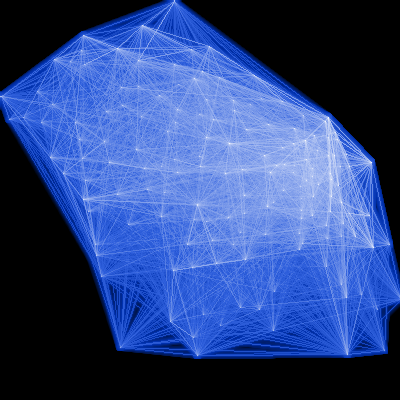

In [86]:
# Se define una hora especifica para el patron de movilidad. En este caso, las 9 a.m.
paths = df181[df181.hora==9]

# se puede optar por visualizar menos datos (tarda en correr)
#paths = paths.iloc[:3000,:]

# genera una matriz de ceros de 400*400. Esta resolucion se puede ajustar (le va a dar el tamaño final a la imagen).
image_data = np.zeros((400,400))

# se aplica la funcion "row_to_pixel" para generar las coordenadas para cada pixel donde hay un punto de partida y llegada
# Esta lista por comprension indexa tomando el row como 'nombre del df' que seria el equivalente a la data de cada index 
# del iterrow. Dentro de cada row se toman las columnas ['lat_or', 'lat_de',...]. Y como shape de define uno fijo (400,400)
xys = [row_to_pixel(row, image_data.shape) for i, row in paths.iterrows()]

# se dibujan las lineas con la segunda funcion que creamos antes ('add_lines')
image_data = add_lines(image_data, xys, weights=None, width = 1)
Image.fromarray(to_image(image_data*10)[:,:,:3],mode="RGB")

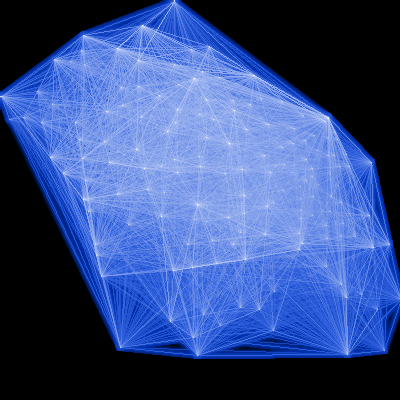

In [87]:
# Probamos con otro pattern de viaje: a las 18hs
paths = df181[df181.hora==18]

# matriz de ceros
image_data = np.zeros((400,400))

# coordenadas para los pixeles
xys = [row_to_pixel(row, image_data.shape) for i, row in paths.iterrows()]

# dibuja lineas
image_data = add_lines(image_data, xys, weights=None, width = 1)
Image.fromarray(to_image(image_data*10)[:,:,:3],mode="RGB")

#### VIAJES UNICOS: AGRUPACION DE VIAJES INDIVIDUALES SEGUN ORIGEN Y DESTINO

Se consideran los recorridos únicos agrupando todos los viajes según conjuntos (estacion-linea-estacion) de partida y llegada: estos son los patrones únicos de viaje.

In [88]:
# se hace una lista con la ubicacion (latitud y longitud) para el id de cada estacion
# no queda claro por qué usa un promedio
ubicacion = df181.groupby("bici_estacion_origen").mean()
ubicacion = ubicacion.loc[:,["lat_or", "lon_or"]]

# agrupa cada par único de "estacion de salida"/"estacion de llegada" y cuenta para cada uno la cantidad de viajes
df181["path_id"] = [(id1,id2) for id1,id2 in zip(df181["bici_estacion_origen"], 
                                                     df181["bici_estacion_destino"])]
paths = df181[df181["hora"]==9].groupby("path_id").count().iloc[:,[1]] 
paths.columns = ["Trip Count"]

# se seleccionan patrones o pares de estaciones con más de "n" (a definir) viajes
paths = paths[paths["Trip Count"]>5]
paths["bici_estacion_origen"] = paths.index.map(lambda x:x[0])
paths["bici_estacion_destino"] = paths.index.map(lambda x:x[1])
paths = paths[paths["bici_estacion_origen"]!=paths["bici_estacion_destino"]]

# se joinea la latitud y la longitud a la nueva tabla de viajes por patrones unicos
paths = paths.join(ubicacion,on="bici_estacion_origen")
ubicacion.columns = ["lat_de","lon_de"]
paths = paths.join(ubicacion,on="bici_estacion_destino")
paths.index = range(len(paths))

paths.shape

(4518, 7)

In [89]:
def get_image_data(paths, min_count=0, max_count=None):
    # matriz de array (zero para pixeles)
    image_data = np.zeros((400*2,400*2))
    
    # genera coordenadas para los pixeles de los puntos de partida y llegada
    if max_count is None:
        max_count = paths["Trip Count"].max()+1
    selector = (paths["Trip Count"]>= min_count) & (paths["Trip Count"]< max_count)
    # aplica la funcion "row_to_pixel" en una comprehension list. 
    xys = [row_to_pixel(row, image_data.shape) for i, row in paths[selector].iterrows()]

    # dibuja las lineas
    image_data = add_lines(image_data, xys, weights=paths["Trip Count"], width = 1)
    return image_data

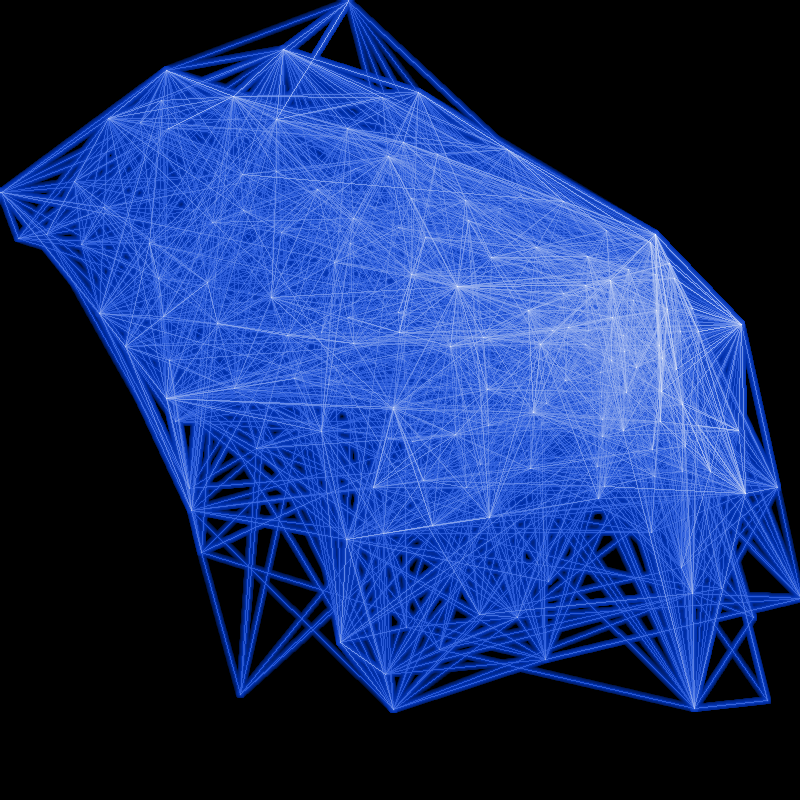

In [90]:
# patrones unicos de viaje
Image.fromarray(to_image(get_image_data(paths)*10)[:,:,:3],mode="RGB")

In [91]:
# Esta funcion tiene un objetivo de representacion grafica. 
# HSV es una medida de saturación
def add_alpha(image_data):
    """
    Uses the Value in HSV as an alpha channel. 
    This creates an image that blends nicely with a black background.
    """
    
    # get hsv image
    hsv = rgb_to_hsv(image_data[:,:,:3].astype(float)/255)
    
    # create new image and set alpha channel
    new_image_data = np.zeros(image_data.shape)
    new_image_data[:,:,3] = hsv[:,:,2]
    
    # set value of hsv image to either 0 or 1.
    hsv[:,:,2] = np.where(hsv[:,:,2]>0, 1, 0)
    
    # combine alpha and new rgb
    new_image_data[:,:,:3] = hsv_to_rgb(hsv)
    return new_image_data

In [92]:
# crear el mapa
folium_caba = folium.Map(location=[-34.6004687,-58.4009038],
                         zoom_start=12,
                         tiles="CartoDB dark_matter",
                         width='100%')

# aplica la funcion "add_alpha"
map_overlay = add_alpha(to_image(image_data*10))

# compute extent of image in lat/lon
aspect_ratio = map_overlay.shape[1]/map_overlay.shape[0]
delta_lat = (max_lon-min_lon)/aspect_ratio*np.cos(min_lat/360*2*np.pi)

# crea la imagen
img = folium.raster_layers.ImageOverlay(map_overlay,
                           bounds = [(max_lat-delta_lat,min_lon),(max_lat,max_lon)],
                           opacity = 1,
                           name = "Paths")

# agrega la imagen al mapa junto a un selector de capas
img.add_to(folium_caba)
folium.LayerControl().add_to(folium_caba)

# plotear el mapa
folium_caba

In [93]:
# Crear nuevo mapa
folium_caba_beta = folium.Map(location=[-34.6004687,-58.4009038],
                         zoom_start=12,
                         tiles="CartoDB dark_matter",
                         width='100%')

# Lista para definir umbrales para "cantidad de viajes por recorrido unico"
thresholds = [5,15,25]

for i,t in enumerate(thresholds):
    upper = thresholds[i+1] if i<len(thresholds)-1 else None
    image_data = get_image_data(paths, t, upper)
    name = "{} < Num. Trips < {}".format(t,"max" if upper is None else upper)

    map_overlay = add_alpha(to_image(image_data*10))
    delta_lat = (max_lon-min_lon)/map_overlay.shape[1]*map_overlay.shape[0]*np.cos(min_lat/360*2*np.pi)
    img = folium.raster_layers.ImageOverlay(map_overlay,
                               bounds = [(max_lat-delta_lat,min_lon),(max_lat,max_lon)],
                               name = name)

    # agrega imagen al mapa
    img.add_to(folium_caba_beta)

# selector de capas    
lc = folium.LayerControl().add_to(folium_caba_beta)

folium_caba_beta

In [94]:
# Hay 4518 patrones de viaje o conexiones entre nodos
paths.sort_values(by='Trip Count', ascending=False).head()

,Trip Count,bici_estacion_origen,bici_estacion_destino,lat_or,lon_or,lat_de,lon_de
1808,242,61,137.0,-34.609533,-58.370238,-34.616373,-58.366874
103,225,4,26.0,-34.602168,-58.368354,-34.601447,-58.363008
61,183,2,48.0,-34.593036,-58.374225,-34.605938,-58.370999
3529,180,135,131.0,-34.596903,-58.379168,-34.592293,-58.373614
96,161,3,79.0,-34.611689,-58.368322,-34.612167,-58.363373


In [95]:
len(paths)

4518

### VIAJES NETOS: PARTE 3 (VISUALIZACION DINAMICA)

In [96]:
from PIL import Image, ImageDraw, ImageFont
from folium.vector_layers import path_options
from folium import plugins
import matplotlib.colors
from matplotlib.colors import LinearSegmentedColormap, rgb_to_hsv, hsv_to_rgb
import scipy.ndimage.filters
import time
import datetime
import sys
import os.path
import io

In [300]:
#! pip install selenium

In [303]:
#! pip install --upgrade git+https://github.com/python-visualization/folium

  Cloning https://github.com/python-visualization/folium to c:\users\federico\appdata\local\temp\pip-req-build-x7yc106x
  Stored in directory: C:\Users\Federico\AppData\Local\Temp\pip-ephem-wheel-cache-h0lytwgt\wheels\1e\e1\75\ecbc91fd5dd5d90befb0b533bf7492d38acffa033310731862
Successfully built folium
  Found existing installation: folium 0.7.0
    Uninstalling folium-0.7.0:
      Successfully uninstalled folium-0.7.0


  Running command git clone -q https://github.com/python-visualization/folium 'C:\Users\Federico\AppData\Local\Temp\pip-req-build-x7yc106x'


In [97]:
import os
os.environ["PATH"] += os.pathsep + "."

#### VISUALIZACION DINAMICA DE NODOS (PARTE1) 

In [98]:
# Funcion para calcular la cantidad de viajes en un tiempo intermedio (entre dos horarios)
def interpolate(df1, df2, x):
    '''
    Devuelve un promedio ponderado de la cantidad de viajes (Arrivos y Salidas) entre dos dataframes 
    correspondientes a dos horas diferentes. 
    ...
    
    Argumentos:
    ----------
    df1 = Dataframe con cantidad de arrivos y salidas calculados para una hora específica
    df2 = Dataframe con cantidad de arrivos y salidas calculados para un horario posterior
    x   = Resto decimal del horario del df1
    '''
    
    # 1 corresponde al entero de la hora inicial, y x al resto en decimales
    df = df1 * (1 - x) + df2 * x
    return df.replace(np.nan, 0)


def get_trip_counts_by_minute(float_hour, data):
    '''
    Devuelve un df con la cantidad de viajes (Arrivos y Salidas) interpolados para cualquier momento del dia, a partir
    de la cantidad de viajes por hora.

    '''    
    columns = ["lat_or",
               "lon_or",
               "Departure Count",
               "Arrival Count"]
    
    # Cantidad de viajes para una hora. Por ejemplo, a las 9:00hs
    df1 = get_trip_counts_by_hour(data, int(float_hour))
    # Cantidad de viajes para hora + 1. Por ejemplo, a las 10:00hs
    df2 = get_trip_counts_by_hour(data, int(float_hour) + 1)
    
    # La funcion "interpolate" usa el resto (valor decimal) de la "float hour" que se le pasa como parametro. Por ejemplo,
    # si se le pasa 9.5, sera 0.5
    df = interpolate(df1.loc[:,columns], 
                     df2.loc[:,columns], 
                     float_hour % 1)
    
    df["bici_nombre_estacion_origen"] = df1["bici_nombre_estacion_origen"]
    return df

In [99]:
# Vemos la cantidad de viajes para un tiempo intermedio. En este caso, 9.5 equivaldria al intermedio entre 9 y las 10
# ... es decir, las nueve y media.
plot_station_counts(get_trip_counts_by_minute(9.5, df181))

In [100]:
def go_arrivals_frame(i, hour_of_day, save_path, bike_data):
    
    '''
    Devuelve una imagen con la captura del mapa generado por la funcion "plot_station_counts"
    ...
    
    Argumentos:
    ----------
    i:            hora de inicio (este argumento esta pensado para ir loopeando dentro de un for)
    hour_of_day:  hora final (hora de calculo para la funcion "get_trip_counts_by_minute")
    save_path:    carpeta de destino para guardar las fotos
    bike_data:    data frame para calcular los viajes netos en la funcion "get_trip_counts_by_minute"
    '''
    
    # crea el mapa con cantidad de viajes (promedio ponderado) entre dos horarios 
    data = get_trip_counts_by_minute(hour_of_day, bike_data)
    my_frame = plot_station_counts(data)
    
    # convierte el plot del mapa que hicimos para el promedio ponderado entre dos horarios en un archivo png como byte array
    png = my_frame._to_png()
    
    # crea las variables "hora" y "minutos" para agregar en la imagen del mapa
    hour = int(hour_of_day)
    minutes = int((hour_of_day % 1) * 60)
    
    # convierte al mapa dinamico en PIL (imagen)
    image = Image.open(io.BytesIO(png))
    draw = ImageDraw.ImageDraw(image)
    
    # carga la fuente. Dejo arial porque no me cargaba Roboto. Se puede cambiar
    font = ImageFont.truetype("arial.ttf", 30)
    
    # agrega a la foto del mapa la hora y los minutos
    draw.text((20,image.height - 50), 
              "hora: {:0>2}:{:0>2}h".format(hour, minutes),
              fill=(255, 255, 255), 
              font=font)
    
    # agrega a la foto del mapa el titulo
    draw.text((image.width - 400,20), 
              "Salidas y arribos netos por hora",
              fill=(255, 255, 255), 
              font=font)
    
    # convierte la foto del mapa en una imagen (PNG)
    filename = os.path.join(save_path, "frame_{:0>5}.png".format(i))
    image.save(filename, "PNG")
    return image

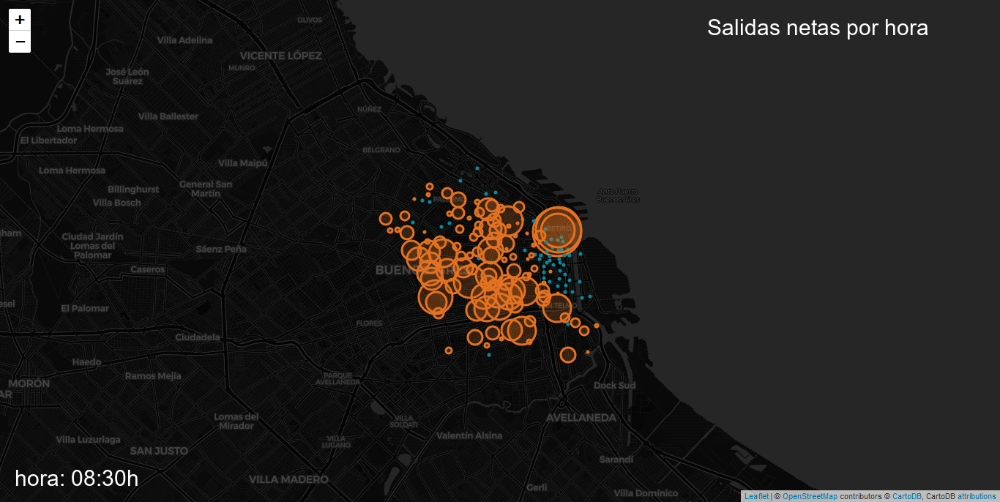

In [103]:
# Crea el directorio donde se van a guardan las fotos. Con esto hay que tener cuidado de no sobrescribir
dir_name = 'frames'
if not os.path.exists(dir_name):
    os.mkdir(dir_name)

# Vemos que la funcion "go_arrivals_ frame" imprime una foto con la captura del mapa generado con "plot_station_counts" en un horario especifico
# Tambien se ve que se gurda en el directorio donde van a ir las fotos de todos los horarios para su posterior compilacion
go_arrivals_frame(1, 8.5, dir_name, df181)

In [115]:
# Definimos una lista con el rango de los horarios de cada una de las fotos que se va a compilar
arrival_times = np.arange(1, 25, .2)

# Corremos la funcion "go_arrival_frames en un for para generar multiples fotos.
for i, hour in enumerate(arrival_times):
    go_arrivals_frame(i, hour, "frames", df181)

In [ ]:
# Arma el video (En command line corre mas rapido y no traba la notebook)
#!ffmpeg -r 10 -i frames/frame_%05d.png -c:v libx264 -vf fps=25 -crf 17 -pix_fmt yuv420p biciviajes.mp4

In [ ]:
# Para hacer un GIF
hours = list(np.arange(1, 24, .2))
hours = hours + hours[::-1]
dir_name = 'gif_frames'
if not os.path.exists(dir_name):
    os.mkdir(dir_name)
for i, hour in enumerate(hours):
    go_arrivals_frame(i, hour, dir_name, df181)

In [ ]:
# Genera paleta de colores. Es mejor correrlo en el command line
#!ffmpeg -y  -t 3 -i gif_frames/frame_%05d.png \-vf fps=10,scale=320:-1:flags=lanczos,palettegen palette.png

In [ ]:
# Arma el GIF. Es mejor correrlo en el command line
#!ffmpeg -r 10  -i gif_frames/frame_%05d.png -i palette.png -filter_complex "fps=10,scale=720:-1:flags=lanczos[x];[x][1:v]paletteuse" header.gif

#### VIZUALIZACION DINAMICA DE NODOS Y EJES (PARTE2) 

En esta seccion se convierte cada nodo (o estacion) en un punto en el mapa conectado por un eje. A su vez, el punto indica el inicio y fin del recorrido. Esto se consigue asociando cada punto a un momento de partida y otro de llegada

Preparamos el dataframe...

In [161]:
# Creamos en nuestro dataframe de bicicletas el tiempo de salida en datetime
df181['Start Time'] = pd.to_datetime(df181['bici_Fecha_hora_retiro'], format='%d%b%Y:%H:%M:%S.%f')

In [165]:
# Traducimos la duracion del viaje en timedeltas
duracion = pd.Series([datetime.timedelta(minutes=i) for i in df181['bici_tiempo_uso']])

In [167]:
# Creamos el tiempo de llegada agregando la 'duracion' al tiempo de salida
df181['Stop Time'] = df181['Start Time'] + duracion

In [169]:
# Chequeamos que el resultado esta bien. Index 0 sale a las 23:56
df181['Start Time'].head()

0   2018-12-31 23:56:42
1   2018-12-19 16:59:36
2   2018-10-23 16:03:06
3   2018-10-05 11:10:09
4   2018-09-26 16:29:10
Name: Start Time, dtype: datetime64[ns]

In [170]:
# Chequeamos que el resultado esta bien. Index 0 llega a las 00:35
df181['Stop Time'].head()

0   2019-01-01 00:35:42
1   2018-12-19 17:59:36
2   2018-10-23 16:41:06
3   2018-10-05 11:48:09
4   2018-09-26 17:20:10
Name: Stop Time, dtype: datetime64[ns]

In [171]:
# Index 0 tarda 39 minutos. Esta OK
df181['bici_tiempo_uso'].head()

0    39.0
1    60.0
2    38.0
3    38.0
4    51.0
Name: bici_tiempo_uso, dtype: float64

Creamos las funciones...

In [128]:
# Función para devolver el progreso de un viaje en "porcentaje" de evolución respecto de un horario específico
def get_path_progress(trips, image_time):
    """ Devuelve una serie de nros. entre 0 y 1 indicando el progreso 
        de cada viaje para un momento determinado
    ...
    Argumentos:
    ----------
    trips : dataframe donde cada fila es un viaje con columnas indicando Start y Stop Time ó duración del viaje.
    image_time : horario de referencia al que corresponde cada imagen (Delta time)
    """
    
    # Esta es la duracion del viaje. En nuestro df inicial este dato existe como tal (no era necesario calcularlo)
    trip_duration = trips["Stop Time"] - trips["Start Time"]
    
    # Hace el porcentaje de un horario pasado como parametro y el horario inicial del viaje para ver "dónde está" el punto para 
    # un momento dado. Seguramente el parametro de tiempo se pase iterando sobre un for
    path_progress = (image_time - trips["Start Time"]).dt.total_seconds() / trip_duration.dt.total_seconds()
    
    # Devuelve valor
    return path_progress

In [129]:
# Funcion para devolver la latitud y longitud de un punto para un momento dado
def get_current_position(trips, progress):
    """ Devuelve la latitud y la longitud para la posición actual de cada viaje.
    Los Paths se representan como lineas derechas entre el principio y el final. 
    ...
    Argumentos:
    ----------
    trips: dataframe conteniendo las columnas de latitud y longitud en origen
    progress: float entre 0 y 1
    """
    
    # la latitud actual corresponde al valor de latitud en origen por "lo que le falta" más "lo que hizo" hasta el momento
    # el último término equivale a ir agregando cómo avanza. Es una forma de encontrar una coordenada por encima de la línea
    current_latitude = trips["lat_or"]*(1 - progress) + \
                       trips["lat_de"]* progress
    # idem longitud
    current_longitude = trips["lon_or"]*(1 - progress) + \
                       trips["lon_de"]* progress
    # devuelve ambos valores
    return current_latitude, current_longitude

In [130]:
# Funcion para devolver las latitudes y longitudes limite de la imagen
def get_min_max(bike_data):
    '''
    Devuelve los valores maximos y minimos de latitud y longitud para un dataframe
    ...
    Argumentos:
    ----------
    bike_data: dataframe con columnas de latitud y longitud
    '''
    min_lat = bike_data["lat_or"].min()
    max_lat = bike_data["lat_de"].max()
    max_lon = bike_data["lon_or"].max()
    min_lon = bike_data["lon_de"].min()
    
    # Devuelve cuatro valores que son los limites de la imagen
    return min_lat, max_lat, min_lon, max_lon

In [ ]:
# Esta funcion es la misma que se usaba para convertir los valores de lat y lon en pixel (visualizacion de ejes) pero 
# pasando las latitudes maximas y minimas ahora como parametros de la funcion
# Se arma para usar dentro de "get_active_trips"

def latlon_to_pixel(lat, lon, image_shape, bounds):
    '''
    Convierte los valores de latitud y longitud en pixel. Esta funcion se arma para usar en row_to_pixel
    ...
    Argumentos:
    ----------
    lat: este valor se pasa recien cuando se aplica row_to_pixel. Se toma como el valor correpondiente de lat y lon 
         origen y destino de cada row del 'dataframe' que esta en paths.iterrow()
    lon: idem pero con longitud de cada punto de origen y destino del 'dataframe'
    image_shape: es un array con la forma de la imagen. Ej. (2147347, 18). 
                 
    bounds: son los valores de las latitudes y longitudes maximas y minimas (los limites de la imagen). Para su uso se
            aplica la funcion 'get_min_max' al dataframe elegido.
    '''
    min_lat, max_lat, min_lon, max_lon = bounds

    # Convierte la longitud en valor pixel (se ve como ajusta el shape de la imagen dividiendo por los extremos)
    # Indexa el vector de la forma para acceder a la cantidad de columnas y dividirla por las longitudes extremas
    delta_x = image_shape[1]/(max_lon-min_lon)
    
    # Convierte la latitud a valor pixel (pareceria estar ajustando por la superficie de una circunferencia)
    delta_y = delta_x/np.cos(lat/360*np.pi*2)
    pixel_y = (max_lat-lat)*delta_y
    pixel_x = (lon-min_lon)*delta_x
    return (pixel_y,pixel_x)

In [131]:
# Funcion para devolver las cuatro coordenadas de un punto. Un par lat-lon para el inicio y otro para el fin
def get_active_trips(image_time, bike_data, image_shape, line_len = .1):
    '''
    Devuelve las coordenadas para los viajes que solamente empezaron pero aun no completaron el viaje 
    para un momento determinado. Son los que empezaron su viaje pero no lo terminaron.
    ...
    Argumentos:
    ----------
    
    image_time: horario de referencia al que corresponde cada imagen (Delta time)
    bike_data: dataframe con columnas indicando en timedeltas El tiempo de salida (Start Time) y llegada (Stop time)
    image_shape: valor numérico en función del cual se filtran los viajes en curso y los concluídos. 
    line_len: parametro fija que se usa para restar al progreso y obtener una 'posicion anterior'
    ''' 
    
    
    # límites (latitud y longitud) de la imágen
    bounds = get_min_max(bike_data)
    
    # selecciona los viajes cuyo tiempo de inicio es menor al del horario pasado como parametro
    active_trips = bike_data[(bike_data["Start Time"]<=image_time)]
    # sobre los anteriores, toma aquellos donde el tiempo de finalizacion es mayor al pasado como parametro. 
    # Es decir, los que van a terminar en algun momento pero no lo han hecho
    active_trips = active_trips[(active_trips["Stop Time"]>=image_time)].copy()
    
    # llama la funcion progress para devolver un número entre 0 y 1 indicando la evolución del viaje
    # Como esto lo hace para cada viaje, devuelve una serie donde cada valor corresponde a un viaje para el image_time indicado
    progress = get_path_progress(active_trips, image_time)
    
    # la función get_current_position devolvía dos valores: la latitud y longitud actual para un momento dado
    # 'active_trips' sería el df de donde se obtiene cada viaje o recorrido
    current_latitude, current_longitude = get_current_position(active_trips, progress)
    
    # con 'np.clip()' devuelve la posicion equivalente al 10% anterior al progreso actual. Pone limites entre cero y uno
    # el start equivaldria al punto en el que se va encontrando cada 0.1 antes del progreso actual (es una foto para un video)
    start_latitude, start_longitude = get_current_position(active_trips, np.clip(progress-line_len, 0, 1))
    
    # devuelve las coordenadas x e y en valor pixel para el punto de inicio
    start_y, start_x = latlon_to_pixel(start_latitude, 
                                       start_longitude, 
                                       image_shape,
                                       bounds)
    
    # devuelve las coordenadas x e y en valor pixel para el punto de llegada. Es el current porque es el ultimo en el que estuvo
    end_y, end_x = latlon_to_pixel(current_latitude, 
                                      current_longitude, 
                                      image_shape,
                                      bounds)
    # arma una lista de 4 valores con los puntos de inicio y fin en pixel
    xys = list(zip(start_x, start_y, end_x, end_y))
    
    # con 'progress.values' se convierte la Serie en un array. Esto sirve para graduar el tamaño de las lineas como parametro
    # de la funcion 'add_lines'. El parametro se pasa como array de valores.
    weights = np.clip((1 - progress.values)*100, 0, 1)
    
    return xys, weights

Revisamos lo que devuelve 'get_active_trips'

In [230]:
# GET_ACTIVE_TRIPS!
# Verificamos cómo devuelve los valores dentro de progress
active_trips = df181[(df181["Start Time"]<=pd.to_datetime('2018-10-05 19:32:00'))]
    
active_trips = active_trips[(active_trips["Stop Time"]>=pd.to_datetime('2018-10-05 19:32:00'))].copy()

In [238]:
# Es una serie primero y despues un array
progress = get_path_progress(active_trips, pd.to_datetime('2018-10-05 19:32:00'))
print(type(progress), type(progress.values))

<class 'pandas.core.series.Series'> <class 'numpy.ndarray'>


NO SE USA 'row_to_pixel'. Es suplantada por 'get_active_trips'

In [132]:
# Esta funcion se diferencia del row_to pixel que creamos antes en que ahora se le puede pasar el parametro 'bounds'
# De todas formas, esta funcion no se utiliza en esta parte. Antes se la utilizaba en una comprehension list para generar
# los valores en pixeles de las coordenadas x e y. En esta seccion eso se hace aplicando directamente 'latlon_to_pixel'
# a partir de 'get_active_trips'.
def row_to_pixel(row, image_shape, bounds):
    """
    Convierte cada fila del dataframe (cada viaje) a coordenadas para el pixel de las estaciones de salida y llegada (punto)
    """
    start_y, start_x = latlon_to_pixel(row["lar_or"], 
                                          row["lon_or"], 
                                          image_shape,
                                          bounds)
    end_y, end_x = latlon_to_pixel(row["lat_de"], 
                                      row["lon_de"], 
                                      image_shape,
                                      bounds)
    xy = (start_x, start_y, end_x, end_y)
    return xy

In [260]:
# Funcion para crear y devolver el mapa en un momento dado
def create_image_map(image_data, bounds):
    '''
    Crea el layer de folium sobre el que se plotea el mapa de la red
    ...
    Argumentos:
    ----------
    image_data: este parametro se define en 'get_image_map'. Basicamente es un array de ceros modificado que contiene 
                los valores de coordenadas origen-destino y de los ejes (arcos) en pixeles. 
    bounds: latitudes y longitudes maximas y minimas (limites). Tambien se pasa con 'get_image_map'
    '''
    
    min_lat, max_lat, min_lon, max_lon = bounds
    
    # se crea el layer dinamico de folium
    folium_map = folium.Map(location=[-34.6004687,-58.4009038],
                            zoom_start=13,
                            tiles="CartoDB dark_matter",
                            width='100%')
    # pasa el image_data a un array con valores RGB
    map_overlay = add_alpha(to_image(image_data))

    # define la extencion de la imagen en lat/lon
    aspect_ratio = map_overlay.shape[1]/map_overlay.shape[0]
    delta_lat = (max_lon-min_lon)/aspect_ratio*np.cos(min_lat/360*2*np.pi)

    # agrega la imagen al mapa
    img = folium.raster_layers.ImageOverlay(map_overlay,
                               bounds = [(max_lat-delta_lat,min_lon),(max_lat,max_lon)],
                               opacity = 1,
                               name = "Paths")

    img.add_to(folium_map)
    folium.LayerControl().add_to(folium_map)

    # devuelve el mapa
    return folium_map

In [133]:
# Funcion para construir la data necesaria para la funcion 'create_image_map'
def get_image_map(frame_time, bike_data):
    '''
    Plotea el mapa sobre un layer de folium para la red de bicicletas en un momento dado
    ...
    Argumentos:
    ----------
    frame_time: hora para la que se desea consultar la red. El valor se debe pasar como 'datetime' 
    bike_data: dataframe de recorridos
    '''
    
    # crea un array de zeros con shape (1800,800)
    image_data = np.zeros((900*2,400*2))
    # latitudes y longitudes minimas en origen y destino. Esto se le pasa a 'create_image_map'
    bounds = get_min_max(bike_data)
    
    # plotea las posiciones actuales
    xys, weights = get_active_trips(frame_time, bike_data, image_data.shape, line_len=.01)
    # agrega los valores de las lineas
    image_data = add_lines(image_data, xys, weights=weights*20, width = 4)
    
    # plotea el eje o camino. El line_len debe ser 1 para que devuelva siempre cero y no 'vaya dibujando una linea' para
    # distintos horarios. Esto se ve en 'get_current_trips' que es la funcion que esta anidada en 'get_active_trips'
    xys, weights = get_active_trips(frame_time, bike_data, image_data.shape, line_len=1)
    image_data = add_lines(image_data, xys, weights=weights*10, width = 2)
    
    # genera y devuelve el folium map
    return create_image_map(image_data, bounds)

In [261]:
get_image_map(pd.to_datetime('2018-10-05 19:32:00'), df181)

In [284]:
def go_paths_frame(params, bike_data=df181):
    """Similar to go_arrivals_frame.
    Generate the image, add annotations, and save image file."""
    i, frame_time = params
    
    my_frame = get_image_map(frame_time, bike_data)
    png = my_frame._to_png()
    
    image = Image.open(io.BytesIO(png))
    draw = ImageDraw.ImageDraw(image)
    font = ImageFont.truetype("arial.ttf", 30)
    
    # add date and time of day text
    draw.text((20,image.height - 50), 
              "hora: {}".format(frame_time),
              fill=(255, 255, 255), 
              font=font)
    
    # draw title
    draw.text((image.width - 450,20), 
              "Recorridos en bicicleta",
              fill=(255, 255, 255), 
              font=font)
    
    # write to a png file
    dir_name = "path_frames"
    if not os.path.exists(dir_name):
        os.mkdir(dir_name)
    image.save(os.path.join(dir_name, "frame_{:0>5}.png".format(i)), "PNG")
    return image

In [316]:
# Podemos ajustar el tiempo de salida
start_time = pd.to_datetime('2018-06-25 08:00:00')
#start_time = pd.to_datetime('2018-10-05 08:00:00')
# Podemos ajustar el tiempo limite
frame_times = [(i, start_time + datetime.timedelta(seconds=30*i)) for i in range(int(361))]
#frame_times = [(i, start_time + datetime.timedelta(seconds=30*i)) for i in range(int(120))]

t0 = time.time()
list(map(go_paths_frame,frame_times))
print("time elapsed: {}".format(time.time()-t0))

time elapsed: 8812.213350057602


Para convertir en video tomar como referencia el de "Salidas netas" y solamente cambiar carpeta de destino.

In [314]:
# Regular de aca y hacer para dos grupos horarios: 9 a 11 y 17 a 19 por ejemplo
s = pd.to_datetime('2018-06-25 08:00:00')
t = [(i, s + datetime.timedelta(seconds=30*i)) for i in range(int(361))]

In [315]:
for i in t:
    print(i)

(0, Timestamp('2018-06-25 08:00:00'))
(1, Timestamp('2018-06-25 08:00:30'))
(2, Timestamp('2018-06-25 08:01:00'))
(3, Timestamp('2018-06-25 08:01:30'))
(4, Timestamp('2018-06-25 08:02:00'))
(5, Timestamp('2018-06-25 08:02:30'))
(6, Timestamp('2018-06-25 08:03:00'))
(7, Timestamp('2018-06-25 08:03:30'))
(8, Timestamp('2018-06-25 08:04:00'))
(9, Timestamp('2018-06-25 08:04:30'))
(10, Timestamp('2018-06-25 08:05:00'))
(11, Timestamp('2018-06-25 08:05:30'))
(12, Timestamp('2018-06-25 08:06:00'))
(13, Timestamp('2018-06-25 08:06:30'))
(14, Timestamp('2018-06-25 08:07:00'))
(15, Timestamp('2018-06-25 08:07:30'))
(16, Timestamp('2018-06-25 08:08:00'))
(17, Timestamp('2018-06-25 08:08:30'))
(18, Timestamp('2018-06-25 08:09:00'))
(19, Timestamp('2018-06-25 08:09:30'))
(20, Timestamp('2018-06-25 08:10:00'))
(21, Timestamp('2018-06-25 08:10:30'))
(22, Timestamp('2018-06-25 08:11:00'))
(23, Timestamp('2018-06-25 08:11:30'))
(24, Timestamp('2018-06-25 08:12:00'))
(25, Timestamp('2018-06-25 08:12:30